In [46]:
from __future__ import print_function
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Взводим руками рандом сид для воспроизводимости обучения
manualSeed = 333
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  333


In [2]:
# Директория с датасетом покемонов. Внимание!!! Чтобы даталоадер работал, необходимо положить картинки в 
# папку по типу .../pokemon/1/0.png, .../pokemon/1/1.png и т.д. Без этого даталоадер работать не будет
dataroot = "./pokemon/"

# Количество воркеров для даталоадера
workers = 1

# Размер батча для обучения
batch_size = 64

# Размер скрытого вектора z
nz = 100

# Число каналов изображения
nc = 3

# Размер карт в генераторе
ngf = 64

# Размер карт в дискриминаторе
ndf = 64

# Кол-во эпох обучения
num_epochs = 1000

Current device : cuda:2


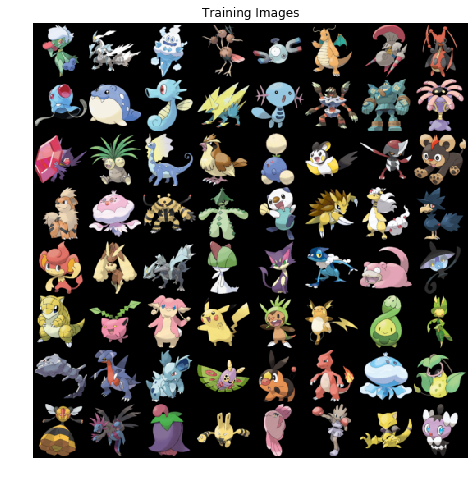

In [3]:
# Выставляем размер картинок
image_size = 64
# Создаем даталоадер
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# переключаемся на куду
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")

print("Current device : {}".format(device))

# Выведем трейнсет, дабы убедиться, что все завелось
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [14]:
# функция для инициализации весов из статьи про GAN
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [15]:
# Генератор

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            # d := image_size, for brevity
            # input: batch_size x nz -->
            nn.ConvTranspose2d(
                in_channels=nz,
                out_channels=ngf * 8, 
                kernel_size=4, 
                stride=1, 
                padding=0, 
                bias=False
            ),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(inplace=True),
            # input: batch_size x (8*ngf) x 4 x 4 --> 
            nn.ConvTranspose2d(
                in_channels=ngf * 8, 
                out_channels=ngf * 4,
                kernel_size=4,
                stride=2,
                padding=1, 
                bias=False
            ),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(inplace=True),
            # input: batch_size x (4*ngf) x 8 x 8 -->
            nn.ConvTranspose2d(
                in_channels=ngf * 4,
                out_channels=ngf * 2,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(inplace=True),
            # input: batch_size x (2*ngf) x 16 x 16
            nn.ConvTranspose2d(
                in_channels=ngf * 2,
                out_channels=ngf,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(ngf),
            nn.ReLU(inplace=True),
            # input: batch_size x ngf x 32 x 32
            nn.ConvTranspose2d(
                in_channels=ngf, 
                out_channels=nc, 
                kernel_size=4, 
                stride=2, 
                padding=1, 
                bias=False
            ),
            nn.Tanh()
            # output: batch_size x 3 x 64 x 64
        )

    def forward(self, input):
        return self.net(input)

In [ ]:
# Дискриминатор
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.net = nn.Sequential(
            # input: batch_size x 3 x 64 x 64
            nn.Conv2d(
                in_channels=nc, 
                out_channels=ndf, 
                kernel_size=4, 
                stride=2, 
                padding=1, 
                bias=False
            ),
            nn.LeakyReLU(0.2, inplace=True),
            # input: batch_size x ndf x 32 x 32
            nn.Conv2d(
                in_channels=ndf,
                out_channels=ndf * 2,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # input: batch_size x (ndf*2) x 16 x 16
            nn.Conv2d(
                in_channels=ndf * 2,
                out_channels=ndf * 4,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # input: batch_size x (ndf*4) x 8 x 8
            nn.Conv2d(
                in_channels=ndf * 4,
                out_channels=ndf * 8,
                kernel_size=4,
                stride=2,
                padding=1,
                bias=False
            ),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # input: batch_size x (ndf*8) x 4 x 4
            nn.Conv2d(
                in_channels=ndf * 8,
                out_channels=1,
                kernel_size=4,
                stride=1,
                padding=0,
                bias=False
            ),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.net(input)

Generator(
  (net): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)
Discriminator(
  (net

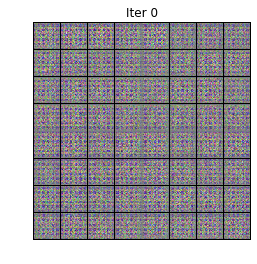

[0/1000][1/13]	Loss_D: -0.0083	Loss_G: -0.4988
[0/1000][2/13]	Loss_D: -0.0093	Loss_G: -0.5007
[0/1000][3/13]	Loss_D: -0.0098	Loss_G: -0.5011
[0/1000][4/13]	Loss_D: -0.0114	Loss_G: -0.5007
[0/1000][5/13]	Loss_D: -0.0139	Loss_G: -0.4997
[0/1000][6/13]	Loss_D: -0.0153	Loss_G: -0.4982
[0/1000][7/13]	Loss_D: -0.0184	Loss_G: -0.4967
[0/1000][8/13]	Loss_D: -0.0213	Loss_G: -0.4950
[0/1000][9/13]	Loss_D: -0.0235	Loss_G: -0.4917
[0/1000][10/13]	Loss_D: -0.0269	Loss_G: -0.4885
[0/1000][11/13]	Loss_D: -0.0313	Loss_G: -0.4848
[0/1000][12/13]	Loss_D: -0.0370	Loss_G: -0.4851
[1/1000][0/13]	Loss_D: -0.0404	Loss_G: -0.4753
[1/1000][1/13]	Loss_D: -0.0478	Loss_G: -0.4754
[1/1000][2/13]	Loss_D: -0.0532	Loss_G: -0.4642
[1/1000][3/13]	Loss_D: -0.0655	Loss_G: -0.4696
[1/1000][4/13]	Loss_D: -0.0648	Loss_G: -0.4538
[1/1000][5/13]	Loss_D: -0.0764	Loss_G: -0.4619
[1/1000][6/13]	Loss_D: -0.0809	Loss_G: -0.4450
[1/1000][7/13]	Loss_D: -0.0939	Loss_G: -0.4538
[1/1000][8/13]	Loss_D: -0.0952	Loss_G: -0.4370
[1/1000][9

[13/1000][5/13]	Loss_D: -0.3241	Loss_G: -0.3636
[13/1000][6/13]	Loss_D: -0.3186	Loss_G: -0.3406
[13/1000][7/13]	Loss_D: -0.3323	Loss_G: -0.3347
[13/1000][8/13]	Loss_D: -0.3313	Loss_G: -0.3326
[13/1000][9/13]	Loss_D: -0.3316	Loss_G: -0.3328
[13/1000][10/13]	Loss_D: -0.3375	Loss_G: -0.3310
[13/1000][11/13]	Loss_D: -0.3351	Loss_G: -0.3321
[13/1000][12/13]	Loss_D: -0.3398	Loss_G: -0.3297
[14/1000][0/13]	Loss_D: -0.3364	Loss_G: -0.3325
[14/1000][1/13]	Loss_D: -0.3319	Loss_G: -0.3320
[14/1000][2/13]	Loss_D: -0.3307	Loss_G: -0.3320
[14/1000][3/13]	Loss_D: -0.3392	Loss_G: -0.3300
[14/1000][4/13]	Loss_D: -0.3359	Loss_G: -0.3318
[14/1000][5/13]	Loss_D: -0.3332	Loss_G: -0.3327
[14/1000][6/13]	Loss_D: -0.3422	Loss_G: -0.3286
[14/1000][7/13]	Loss_D: -0.3376	Loss_G: -0.3302
[14/1000][8/13]	Loss_D: -0.3381	Loss_G: -0.3312
[14/1000][9/13]	Loss_D: -0.3372	Loss_G: -0.3302
[14/1000][10/13]	Loss_D: -0.3382	Loss_G: -0.3301
[14/1000][11/13]	Loss_D: -0.3382	Loss_G: -0.3314
[14/1000][12/13]	Loss_D: -0.3375	Lo

[26/1000][6/13]	Loss_D: -0.3438	Loss_G: -0.3273
[26/1000][7/13]	Loss_D: -0.3495	Loss_G: -0.3256
[26/1000][8/13]	Loss_D: -0.3450	Loss_G: -0.3268
[26/1000][9/13]	Loss_D: -0.3403	Loss_G: -0.3317
[26/1000][10/13]	Loss_D: -0.3394	Loss_G: -0.3272
[26/1000][11/13]	Loss_D: -0.3438	Loss_G: -0.3287
[26/1000][12/13]	Loss_D: -0.3413	Loss_G: -0.3268
[27/1000][0/13]	Loss_D: -0.3461	Loss_G: -0.3276
[27/1000][1/13]	Loss_D: -0.3435	Loss_G: -0.3287
[27/1000][2/13]	Loss_D: -0.3416	Loss_G: -0.3275
[27/1000][3/13]	Loss_D: -0.3460	Loss_G: -0.3270
[27/1000][4/13]	Loss_D: -0.3434	Loss_G: -0.3286
[27/1000][5/13]	Loss_D: -0.3479	Loss_G: -0.3261
[27/1000][6/13]	Loss_D: -0.3480	Loss_G: -0.3264
[27/1000][7/13]	Loss_D: -0.3491	Loss_G: -0.3264
[27/1000][8/13]	Loss_D: -0.3400	Loss_G: -0.3335
[27/1000][9/13]	Loss_D: -0.1483	Loss_G: -0.3543
[27/1000][10/13]	Loss_D: -0.3358	Loss_G: -0.3405
[27/1000][11/13]	Loss_D: -0.3329	Loss_G: -0.3291
[27/1000][12/13]	Loss_D: -0.3437	Loss_G: -0.3280
[28/1000][0/13]	Loss_D: -0.3414	Lo

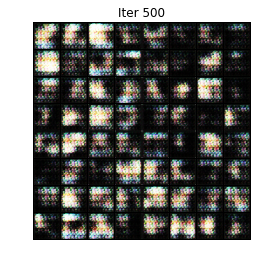

[38/1000][7/13]	Loss_D: -0.3431	Loss_G: -0.3286
[38/1000][8/13]	Loss_D: -0.3444	Loss_G: -0.3281
[38/1000][9/13]	Loss_D: -0.2426	Loss_G: -0.4608
[38/1000][10/13]	Loss_D: -0.2628	Loss_G: -0.3594
[38/1000][11/13]	Loss_D: -0.3104	Loss_G: -0.3262
[38/1000][12/13]	Loss_D: -0.3463	Loss_G: -0.3271
[39/1000][0/13]	Loss_D: -0.3465	Loss_G: -0.3277
[39/1000][1/13]	Loss_D: -0.3491	Loss_G: -0.3256
[39/1000][2/13]	Loss_D: -0.3501	Loss_G: -0.3256
[39/1000][3/13]	Loss_D: -0.3502	Loss_G: -0.3268
[39/1000][4/13]	Loss_D: -0.3463	Loss_G: -0.3262
[39/1000][5/13]	Loss_D: -0.3430	Loss_G: -0.3291
[39/1000][6/13]	Loss_D: -0.3446	Loss_G: -0.3270
[39/1000][7/13]	Loss_D: -0.3435	Loss_G: -0.3282
[39/1000][8/13]	Loss_D: -0.3495	Loss_G: -0.3258
[39/1000][9/13]	Loss_D: -0.3478	Loss_G: -0.3271
[39/1000][10/13]	Loss_D: -0.3412	Loss_G: -0.3296
[39/1000][11/13]	Loss_D: -0.3461	Loss_G: -0.3267
[39/1000][12/13]	Loss_D: -0.3476	Loss_G: -0.3268
[40/1000][0/13]	Loss_D: -0.3473	Loss_G: -0.3269
[40/1000][1/13]	Loss_D: -0.3435	Lo

[51/1000][8/13]	Loss_D: -0.2317	Loss_G: -0.3275
[51/1000][9/13]	Loss_D: -0.2142	Loss_G: -0.3536
[51/1000][10/13]	Loss_D: -0.3340	Loss_G: -0.3335
[51/1000][11/13]	Loss_D: -0.3354	Loss_G: -0.3316
[51/1000][12/13]	Loss_D: -0.3348	Loss_G: -0.3332
[52/1000][0/13]	Loss_D: -0.3364	Loss_G: -0.3314
[52/1000][1/13]	Loss_D: -0.3293	Loss_G: -0.3363
[52/1000][2/13]	Loss_D: -0.3181	Loss_G: -0.3304
[52/1000][3/13]	Loss_D: -0.3369	Loss_G: -0.3318
[52/1000][4/13]	Loss_D: -0.3336	Loss_G: -0.3345
[52/1000][5/13]	Loss_D: -0.3310	Loss_G: -0.3327
[52/1000][6/13]	Loss_D: -0.3253	Loss_G: -0.3341
[52/1000][7/13]	Loss_D: -0.3277	Loss_G: -0.3337
[52/1000][8/13]	Loss_D: -0.3293	Loss_G: -0.3321
[52/1000][9/13]	Loss_D: -0.3331	Loss_G: -0.3327
[52/1000][10/13]	Loss_D: -0.3254	Loss_G: -0.3346
[52/1000][11/13]	Loss_D: -0.3305	Loss_G: -0.3312
[52/1000][12/13]	Loss_D: -0.3246	Loss_G: -0.3407
[53/1000][0/13]	Loss_D: -0.2543	Loss_G: -0.3314
[53/1000][1/13]	Loss_D: -0.3128	Loss_G: -0.3378
[53/1000][2/13]	Loss_D: -0.3289	Lo

[64/1000][9/13]	Loss_D: -0.3378	Loss_G: -0.3299
[64/1000][10/13]	Loss_D: -0.3266	Loss_G: -0.3367
[64/1000][11/13]	Loss_D: -0.0927	Loss_G: -0.3600
[64/1000][12/13]	Loss_D: -0.2774	Loss_G: -0.3292
[65/1000][0/13]	Loss_D: -0.3286	Loss_G: -0.3338
[65/1000][1/13]	Loss_D: -0.3320	Loss_G: -0.3339
[65/1000][2/13]	Loss_D: -0.3341	Loss_G: -0.3322
[65/1000][3/13]	Loss_D: -0.3259	Loss_G: -0.3374
[65/1000][4/13]	Loss_D: -0.3244	Loss_G: -0.3324
[65/1000][5/13]	Loss_D: -0.3344	Loss_G: -0.3325
[65/1000][6/13]	Loss_D: -0.3285	Loss_G: -0.3358
[65/1000][7/13]	Loss_D: -0.3314	Loss_G: -0.3341
[65/1000][8/13]	Loss_D: -0.3280	Loss_G: -0.3319
[65/1000][9/13]	Loss_D: -0.3306	Loss_G: -0.3342
[65/1000][10/13]	Loss_D: -0.3266	Loss_G: -0.3320
[65/1000][11/13]	Loss_D: -0.3401	Loss_G: -0.3322
[65/1000][12/13]	Loss_D: -0.3367	Loss_G: -0.3318
[66/1000][0/13]	Loss_D: -0.3344	Loss_G: -0.3319
[66/1000][1/13]	Loss_D: -0.3298	Loss_G: -0.3299
[66/1000][2/13]	Loss_D: -0.3416	Loss_G: -0.3289
[66/1000][3/13]	Loss_D: -0.3374	Lo

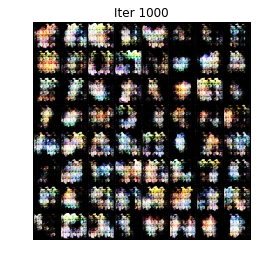

[77/1000][0/13]	Loss_D: -0.3061	Loss_G: -0.3311
[77/1000][1/13]	Loss_D: -0.3257	Loss_G: -0.3342
[77/1000][2/13]	Loss_D: -0.3348	Loss_G: -0.3314
[77/1000][3/13]	Loss_D: -0.3324	Loss_G: -0.3308
[77/1000][4/13]	Loss_D: -0.3238	Loss_G: -0.3386
[77/1000][5/13]	Loss_D: -0.2379	Loss_G: -0.3331
[77/1000][6/13]	Loss_D: -0.3194	Loss_G: -0.3366
[77/1000][7/13]	Loss_D: -0.3343	Loss_G: -0.3311
[77/1000][8/13]	Loss_D: -0.3347	Loss_G: -0.3326
[77/1000][9/13]	Loss_D: -0.3314	Loss_G: -0.3323
[77/1000][10/13]	Loss_D: -0.3340	Loss_G: -0.3319
[77/1000][11/13]	Loss_D: -0.3298	Loss_G: -0.3328
[77/1000][12/13]	Loss_D: -0.3301	Loss_G: -0.3352
[78/1000][0/13]	Loss_D: -0.3143	Loss_G: -0.3297
[78/1000][1/13]	Loss_D: -0.3354	Loss_G: -0.3322
[78/1000][2/13]	Loss_D: -0.3292	Loss_G: -0.3325
[78/1000][3/13]	Loss_D: -0.3320	Loss_G: -0.3340
[78/1000][4/13]	Loss_D: -0.3247	Loss_G: -0.3347
[78/1000][5/13]	Loss_D: -0.3307	Loss_G: -0.3326
[78/1000][6/13]	Loss_D: -0.3218	Loss_G: -0.3354
[78/1000][7/13]	Loss_D: -0.3177	Loss_

[90/1000][1/13]	Loss_D: -0.3187	Loss_G: -0.3346
[90/1000][2/13]	Loss_D: -0.3144	Loss_G: -0.3451
[90/1000][3/13]	Loss_D: -0.3107	Loss_G: -0.3373
[90/1000][4/13]	Loss_D: -0.3193	Loss_G: -0.3376
[90/1000][5/13]	Loss_D: -0.3170	Loss_G: -0.3451
[90/1000][6/13]	Loss_D: -0.1059	Loss_G: -0.3339
[90/1000][7/13]	Loss_D: -0.3208	Loss_G: -0.3383
[90/1000][8/13]	Loss_D: -0.3194	Loss_G: -0.3394
[90/1000][9/13]	Loss_D: -0.3205	Loss_G: -0.3374
[90/1000][10/13]	Loss_D: -0.3217	Loss_G: -0.3401
[90/1000][11/13]	Loss_D: -0.3109	Loss_G: -0.3339
[90/1000][12/13]	Loss_D: -0.3087	Loss_G: -0.3490
[91/1000][0/13]	Loss_D: -0.2073	Loss_G: -0.3333
[91/1000][1/13]	Loss_D: -0.2858	Loss_G: -0.3517
[91/1000][2/13]	Loss_D: -0.3197	Loss_G: -0.3373
[91/1000][3/13]	Loss_D: -0.3230	Loss_G: -0.3357
[91/1000][4/13]	Loss_D: -0.3282	Loss_G: -0.3340
[91/1000][5/13]	Loss_D: -0.3268	Loss_G: -0.3355
[91/1000][6/13]	Loss_D: -0.3219	Loss_G: -0.3384
[91/1000][7/13]	Loss_D: -0.3164	Loss_G: -0.3412
[91/1000][8/13]	Loss_D: -0.3170	Loss_

[103/1000][2/13]	Loss_D: -0.3119	Loss_G: -0.3420
[103/1000][3/13]	Loss_D: -0.3159	Loss_G: -0.3412
[103/1000][4/13]	Loss_D: -0.2990	Loss_G: -0.3385
[103/1000][5/13]	Loss_D: -0.3019	Loss_G: -0.3511
[103/1000][6/13]	Loss_D: -0.2831	Loss_G: -0.3372
[103/1000][7/13]	Loss_D: -0.2974	Loss_G: -0.3536
[103/1000][8/13]	Loss_D: -0.2610	Loss_G: -0.3366
[103/1000][9/13]	Loss_D: -0.3130	Loss_G: -0.3447
[103/1000][10/13]	Loss_D: -0.3032	Loss_G: -0.3451
[103/1000][11/13]	Loss_D: -0.2946	Loss_G: -0.3523
[103/1000][12/13]	Loss_D: -0.2372	Loss_G: -0.3301
[104/1000][0/13]	Loss_D: -0.2808	Loss_G: -0.3397
[104/1000][1/13]	Loss_D: -0.3102	Loss_G: -0.3427
[104/1000][2/13]	Loss_D: -0.3161	Loss_G: -0.3425
[104/1000][3/13]	Loss_D: -0.3102	Loss_G: -0.3412
[104/1000][4/13]	Loss_D: -0.2979	Loss_G: -0.3498
[104/1000][5/13]	Loss_D: -0.2397	Loss_G: -0.3311
[104/1000][6/13]	Loss_D: -0.2936	Loss_G: -0.3493
[104/1000][7/13]	Loss_D: -0.3169	Loss_G: -0.3404
[104/1000][8/13]	Loss_D: -0.3140	Loss_G: -0.3427
[104/1000][9/13]	

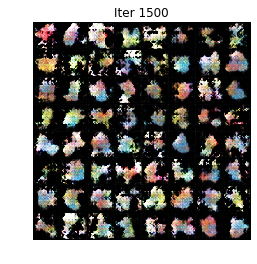

[115/1000][6/13]	Loss_D: -0.2707	Loss_G: -0.3589
[115/1000][7/13]	Loss_D: -0.2601	Loss_G: -0.3361
[115/1000][8/13]	Loss_D: -0.3100	Loss_G: -0.3452
[115/1000][9/13]	Loss_D: -0.3105	Loss_G: -0.3455
[115/1000][10/13]	Loss_D: -0.3092	Loss_G: -0.3421
[115/1000][11/13]	Loss_D: -0.3084	Loss_G: -0.3444
[115/1000][12/13]	Loss_D: -0.2956	Loss_G: -0.3482
[116/1000][0/13]	Loss_D: -0.2969	Loss_G: -0.3432
[116/1000][1/13]	Loss_D: -0.3054	Loss_G: -0.3476
[116/1000][2/13]	Loss_D: -0.3036	Loss_G: -0.3413
[116/1000][3/13]	Loss_D: -0.2997	Loss_G: -0.3558
[116/1000][4/13]	Loss_D: -0.2953	Loss_G: -0.3498
[116/1000][5/13]	Loss_D: -0.3102	Loss_G: -0.3438
[116/1000][6/13]	Loss_D: -0.3089	Loss_G: -0.3438
[116/1000][7/13]	Loss_D: -0.2980	Loss_G: -0.3429
[116/1000][8/13]	Loss_D: -0.3054	Loss_G: -0.3501
[116/1000][9/13]	Loss_D: -0.2132	Loss_G: -0.3340
[116/1000][10/13]	Loss_D: -0.2940	Loss_G: -0.3563
[116/1000][11/13]	Loss_D: -0.2768	Loss_G: -0.3389
[116/1000][12/13]	Loss_D: -0.3140	Loss_G: -0.3430
[117/1000][0/1

[128/1000][4/13]	Loss_D: -0.3053	Loss_G: -0.3525
[128/1000][5/13]	Loss_D: -0.2915	Loss_G: -0.3460
[128/1000][6/13]	Loss_D: -0.2968	Loss_G: -0.3538
[128/1000][7/13]	Loss_D: -0.2448	Loss_G: -0.3315
[128/1000][8/13]	Loss_D: -0.2987	Loss_G: -0.3468
[128/1000][9/13]	Loss_D: -0.3058	Loss_G: -0.3460
[128/1000][10/13]	Loss_D: -0.3045	Loss_G: -0.3472
[128/1000][11/13]	Loss_D: -0.2909	Loss_G: -0.3465
[128/1000][12/13]	Loss_D: -0.3016	Loss_G: -0.3495
[129/1000][0/13]	Loss_D: -0.2921	Loss_G: -0.3435
[129/1000][1/13]	Loss_D: -0.2950	Loss_G: -0.3488
[129/1000][2/13]	Loss_D: -0.2962	Loss_G: -0.3609
[129/1000][3/13]	Loss_D: -0.2876	Loss_G: -0.3578
[129/1000][4/13]	Loss_D: -0.2981	Loss_G: -0.3428
[129/1000][5/13]	Loss_D: -0.3016	Loss_G: -0.3546
[129/1000][6/13]	Loss_D: -0.3061	Loss_G: -0.3431
[129/1000][7/13]	Loss_D: -0.3093	Loss_G: -0.3469
[129/1000][8/13]	Loss_D: -0.2961	Loss_G: -0.3471
[129/1000][9/13]	Loss_D: -0.2997	Loss_G: -0.3493
[129/1000][10/13]	Loss_D: -0.3005	Loss_G: -0.3512
[129/1000][11/13

[141/1000][2/13]	Loss_D: -0.2473	Loss_G: -0.3420
[141/1000][3/13]	Loss_D: -0.1620	Loss_G: -0.4188
[141/1000][4/13]	Loss_D: -0.2504	Loss_G: -0.3773
[141/1000][5/13]	Loss_D: -0.2391	Loss_G: -0.3419
[141/1000][6/13]	Loss_D: -0.2691	Loss_G: -0.3765
[141/1000][7/13]	Loss_D: -0.2626	Loss_G: -0.3496
[141/1000][8/13]	Loss_D: -0.2354	Loss_G: -0.4154
[141/1000][9/13]	Loss_D: -0.1907	Loss_G: -0.4592
[141/1000][10/13]	Loss_D: -0.1120	Loss_G: -0.3904
[141/1000][11/13]	Loss_D: -0.2482	Loss_G: -0.3427
[141/1000][12/13]	Loss_D: -0.2798	Loss_G: -0.3647
[142/1000][0/13]	Loss_D: -0.2940	Loss_G: -0.3525
[142/1000][1/13]	Loss_D: -0.2973	Loss_G: -0.3519
[142/1000][2/13]	Loss_D: -0.2939	Loss_G: -0.3493
[142/1000][3/13]	Loss_D: -0.2944	Loss_G: -0.3526
[142/1000][4/13]	Loss_D: -0.2974	Loss_G: -0.3478
[142/1000][5/13]	Loss_D: -0.3008	Loss_G: -0.3499
[142/1000][6/13]	Loss_D: -0.3039	Loss_G: -0.3501
[142/1000][7/13]	Loss_D: -0.3074	Loss_G: -0.3442
[142/1000][8/13]	Loss_D: -0.2991	Loss_G: -0.3527
[142/1000][9/13]	

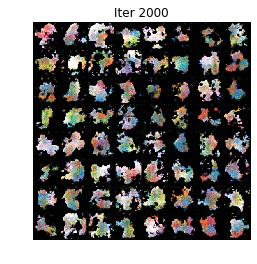

[153/1000][12/13]	Loss_D: -0.2970	Loss_G: -0.3507
[154/1000][0/13]	Loss_D: -0.2836	Loss_G: -0.3691
[154/1000][1/13]	Loss_D: -0.2459	Loss_G: -0.3435
[154/1000][2/13]	Loss_D: -0.2905	Loss_G: -0.3573
[154/1000][3/13]	Loss_D: -0.3006	Loss_G: -0.3498
[154/1000][4/13]	Loss_D: -0.3012	Loss_G: -0.3470
[154/1000][5/13]	Loss_D: -0.3024	Loss_G: -0.3484
[154/1000][6/13]	Loss_D: -0.2883	Loss_G: -0.3637
[154/1000][7/13]	Loss_D: -0.2954	Loss_G: -0.3534
[154/1000][8/13]	Loss_D: -0.2854	Loss_G: -0.3469
[154/1000][9/13]	Loss_D: -0.2817	Loss_G: -0.3685
[154/1000][10/13]	Loss_D: -0.1976	Loss_G: -0.3358
[154/1000][11/13]	Loss_D: -0.2888	Loss_G: -0.3620
[154/1000][12/13]	Loss_D: -0.2662	Loss_G: -0.3391
[155/1000][0/13]	Loss_D: -0.2964	Loss_G: -0.3554
[155/1000][1/13]	Loss_D: -0.2940	Loss_G: -0.3472
[155/1000][2/13]	Loss_D: -0.2891	Loss_G: -0.3622
[155/1000][3/13]	Loss_D: -0.2339	Loss_G: -0.3358
[155/1000][4/13]	Loss_D: -0.2887	Loss_G: -0.3543
[155/1000][5/13]	Loss_D: -0.2925	Loss_G: -0.3530
[155/1000][6/13]

[166/1000][10/13]	Loss_D: -0.2676	Loss_G: -0.3494
[166/1000][11/13]	Loss_D: -0.2773	Loss_G: -0.3653
[166/1000][12/13]	Loss_D: -0.2812	Loss_G: -0.3518
[167/1000][0/13]	Loss_D: -0.2756	Loss_G: -0.3748
[167/1000][1/13]	Loss_D: -0.2820	Loss_G: -0.3513
[167/1000][2/13]	Loss_D: -0.2554	Loss_G: -0.3866
[167/1000][3/13]	Loss_D: -0.2254	Loss_G: -0.3459
[167/1000][4/13]	Loss_D: -0.2807	Loss_G: -0.3657
[167/1000][5/13]	Loss_D: -0.2887	Loss_G: -0.3560
[167/1000][6/13]	Loss_D: -0.2803	Loss_G: -0.3580
[167/1000][7/13]	Loss_D: -0.2800	Loss_G: -0.3570
[167/1000][8/13]	Loss_D: -0.2824	Loss_G: -0.3571
[167/1000][9/13]	Loss_D: -0.2779	Loss_G: -0.3717
[167/1000][10/13]	Loss_D: -0.2672	Loss_G: -0.3457
[167/1000][11/13]	Loss_D: -0.1018	Loss_G: -0.3784
[167/1000][12/13]	Loss_D: -0.2320	Loss_G: -0.3378
[168/1000][0/13]	Loss_D: -0.2750	Loss_G: -0.3708
[168/1000][1/13]	Loss_D: -0.2723	Loss_G: -0.3452
[168/1000][2/13]	Loss_D: -0.2631	Loss_G: -0.3984
[168/1000][3/13]	Loss_D: -0.1897	Loss_G: -0.3457
[168/1000][4/1

[179/1000][9/13]	Loss_D: -0.2431	Loss_G: -0.3904
[179/1000][10/13]	Loss_D: -0.2437	Loss_G: -0.3457
[179/1000][11/13]	Loss_D: -0.2890	Loss_G: -0.3565
[179/1000][12/13]	Loss_D: -0.2917	Loss_G: -0.3556
[180/1000][0/13]	Loss_D: -0.2880	Loss_G: -0.3585
[180/1000][1/13]	Loss_D: -0.2829	Loss_G: -0.3638
[180/1000][2/13]	Loss_D: -0.2875	Loss_G: -0.3542
[180/1000][3/13]	Loss_D: -0.2100	Loss_G: -0.4362
[180/1000][4/13]	Loss_D: -0.1965	Loss_G: -0.3421
[180/1000][5/13]	Loss_D: -0.2162	Loss_G: -0.4469
[180/1000][6/13]	Loss_D: -0.2620	Loss_G: -0.3668
[180/1000][7/13]	Loss_D: -0.2647	Loss_G: -0.3538
[180/1000][8/13]	Loss_D: -0.2690	Loss_G: -0.3740
[180/1000][9/13]	Loss_D: -0.2217	Loss_G: -0.3371
[180/1000][10/13]	Loss_D: -0.2240	Loss_G: -0.4019
[180/1000][11/13]	Loss_D: -0.2411	Loss_G: -0.3425
[180/1000][12/13]	Loss_D: -0.2908	Loss_G: -0.3584
[181/1000][0/13]	Loss_D: -0.2943	Loss_G: -0.3549
[181/1000][1/13]	Loss_D: -0.2836	Loss_G: -0.3617
[181/1000][2/13]	Loss_D: -0.2662	Loss_G: -0.3521
[181/1000][3/1

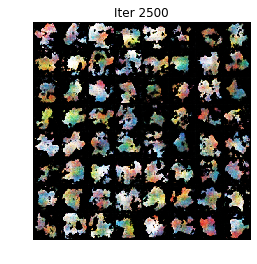

[192/1000][5/13]	Loss_D: -0.2263	Loss_G: -0.4119
[192/1000][6/13]	Loss_D: -0.2432	Loss_G: -0.3438
[192/1000][7/13]	Loss_D: -0.2541	Loss_G: -0.3847
[192/1000][8/13]	Loss_D: -0.2614	Loss_G: -0.3520
[192/1000][9/13]	Loss_D: -0.2591	Loss_G: -0.3775
[192/1000][10/13]	Loss_D: -0.2575	Loss_G: -0.3488
[192/1000][11/13]	Loss_D: -0.2587	Loss_G: -0.3886
[192/1000][12/13]	Loss_D: -0.2076	Loss_G: -0.3433
[193/1000][0/13]	Loss_D: -0.2169	Loss_G: -0.4300
[193/1000][1/13]	Loss_D: -0.2451	Loss_G: -0.3502
[193/1000][2/13]	Loss_D: -0.2397	Loss_G: -0.4100
[193/1000][3/13]	Loss_D: -0.2454	Loss_G: -0.3467
[193/1000][4/13]	Loss_D: -0.2287	Loss_G: -0.4076
[193/1000][5/13]	Loss_D: -0.2382	Loss_G: -0.3475
[193/1000][6/13]	Loss_D: -0.2808	Loss_G: -0.3624
[193/1000][7/13]	Loss_D: -0.2777	Loss_G: -0.3688
[193/1000][8/13]	Loss_D: -0.2721	Loss_G: -0.3626
[193/1000][9/13]	Loss_D: -0.2642	Loss_G: -0.3611
[193/1000][10/13]	Loss_D: -0.2667	Loss_G: -0.3839
[193/1000][11/13]	Loss_D: -0.2319	Loss_G: -0.3431
[193/1000][12/1

[205/1000][3/13]	Loss_D: -0.2216	Loss_G: -0.3485
[205/1000][4/13]	Loss_D: -0.2767	Loss_G: -0.3691
[205/1000][5/13]	Loss_D: -0.2801	Loss_G: -0.3615
[205/1000][6/13]	Loss_D: -0.2635	Loss_G: -0.3644
[205/1000][7/13]	Loss_D: -0.2649	Loss_G: -0.3693
[205/1000][8/13]	Loss_D: -0.2487	Loss_G: -0.3515
[205/1000][9/13]	Loss_D: -0.1749	Loss_G: -0.4653
[205/1000][10/13]	Loss_D: -0.1825	Loss_G: -0.3418
[205/1000][11/13]	Loss_D: -0.2393	Loss_G: -0.4010
[205/1000][12/13]	Loss_D: -0.2099	Loss_G: -0.3439
[206/1000][0/13]	Loss_D: -0.2510	Loss_G: -0.3971
[206/1000][1/13]	Loss_D: -0.2692	Loss_G: -0.3507
[206/1000][2/13]	Loss_D: -0.2777	Loss_G: -0.3630
[206/1000][3/13]	Loss_D: -0.2755	Loss_G: -0.3561
[206/1000][4/13]	Loss_D: -0.2281	Loss_G: -0.4311
[206/1000][5/13]	Loss_D: -0.1519	Loss_G: -0.3407
[206/1000][6/13]	Loss_D: -0.2021	Loss_G: -0.4186
[206/1000][7/13]	Loss_D: -0.1942	Loss_G: -0.3442
[206/1000][8/13]	Loss_D: -0.2556	Loss_G: -0.3951
[206/1000][9/13]	Loss_D: -0.2648	Loss_G: -0.3527
[206/1000][10/13]

[218/1000][1/13]	Loss_D: -0.2732	Loss_G: -0.3565
[218/1000][2/13]	Loss_D: -0.2548	Loss_G: -0.4105
[218/1000][3/13]	Loss_D: -0.1837	Loss_G: -0.3434
[218/1000][4/13]	Loss_D: -0.1758	Loss_G: -0.4288
[218/1000][5/13]	Loss_D: -0.2108	Loss_G: -0.3453
[218/1000][6/13]	Loss_D: -0.2607	Loss_G: -0.3849
[218/1000][7/13]	Loss_D: -0.2618	Loss_G: -0.3542
[218/1000][8/13]	Loss_D: -0.2665	Loss_G: -0.3820
[218/1000][9/13]	Loss_D: -0.2613	Loss_G: -0.3521
[218/1000][10/13]	Loss_D: -0.2452	Loss_G: -0.4119
[218/1000][11/13]	Loss_D: -0.2003	Loss_G: -0.3446
[218/1000][12/13]	Loss_D: -0.2244	Loss_G: -0.4589
[219/1000][0/13]	Loss_D: -0.2072	Loss_G: -0.3449
[219/1000][1/13]	Loss_D: -0.2342	Loss_G: -0.4080
[219/1000][2/13]	Loss_D: -0.2237	Loss_G: -0.3438
[219/1000][3/13]	Loss_D: -0.2619	Loss_G: -0.3828
[219/1000][4/13]	Loss_D: -0.2707	Loss_G: -0.3550
[219/1000][5/13]	Loss_D: -0.2761	Loss_G: -0.3678
[219/1000][6/13]	Loss_D: -0.2565	Loss_G: -0.3589
[219/1000][7/13]	Loss_D: -0.2696	Loss_G: -0.3706
[219/1000][8/13]	

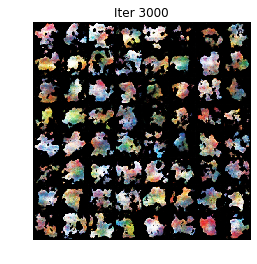

[230/1000][11/13]	Loss_D: -0.1872	Loss_G: -0.5054
[230/1000][12/13]	Loss_D: -0.1085	Loss_G: -0.3493
[231/1000][0/13]	Loss_D: -0.2683	Loss_G: -0.3707
[231/1000][1/13]	Loss_D: -0.2644	Loss_G: -0.3533
[231/1000][2/13]	Loss_D: -0.2528	Loss_G: -0.3965
[231/1000][3/13]	Loss_D: -0.1072	Loss_G: -0.3439
[231/1000][4/13]	Loss_D: -0.2462	Loss_G: -0.4107
[231/1000][5/13]	Loss_D: -0.2037	Loss_G: -0.3453
[231/1000][6/13]	Loss_D: -0.2193	Loss_G: -0.4312
[231/1000][7/13]	Loss_D: -0.2274	Loss_G: -0.3456
[231/1000][8/13]	Loss_D: -0.2871	Loss_G: -0.3581
[231/1000][9/13]	Loss_D: -0.2838	Loss_G: -0.3588
[231/1000][10/13]	Loss_D: -0.2397	Loss_G: -0.4075
[231/1000][11/13]	Loss_D: -0.2119	Loss_G: -0.3410
[231/1000][12/13]	Loss_D: -0.2788	Loss_G: -0.3664
[232/1000][0/13]	Loss_D: -0.2573	Loss_G: -0.3545
[232/1000][1/13]	Loss_D: -0.2727	Loss_G: -0.3704
[232/1000][2/13]	Loss_D: -0.2646	Loss_G: -0.3564
[232/1000][3/13]	Loss_D: -0.2712	Loss_G: -0.3673
[232/1000][4/13]	Loss_D: -0.2568	Loss_G: -0.3554
[232/1000][5/13

[243/1000][9/13]	Loss_D: -0.2845	Loss_G: -0.3550
[243/1000][10/13]	Loss_D: -0.2926	Loss_G: -0.3616
[243/1000][11/13]	Loss_D: -0.2736	Loss_G: -0.3617
[243/1000][12/13]	Loss_D: -0.2794	Loss_G: -0.3591
[244/1000][0/13]	Loss_D: -0.2473	Loss_G: -0.4169
[244/1000][1/13]	Loss_D: -0.1231	Loss_G: -0.3464
[244/1000][2/13]	Loss_D: -0.2584	Loss_G: -0.3598
[244/1000][3/13]	Loss_D: -0.2734	Loss_G: -0.3759
[244/1000][4/13]	Loss_D: -0.2763	Loss_G: -0.3519
[244/1000][5/13]	Loss_D: -0.2732	Loss_G: -0.3796
[244/1000][6/13]	Loss_D: -0.1809	Loss_G: -0.3398
[244/1000][7/13]	Loss_D: -0.1966	Loss_G: -0.4160
[244/1000][8/13]	Loss_D: -0.1298	Loss_G: -0.3492
[244/1000][9/13]	Loss_D: -0.1890	Loss_G: -0.4615
[244/1000][10/13]	Loss_D: -0.2210	Loss_G: -0.3448
[244/1000][11/13]	Loss_D: -0.2492	Loss_G: -0.3843
[244/1000][12/13]	Loss_D: -0.2797	Loss_G: -0.3539
[245/1000][0/13]	Loss_D: -0.2867	Loss_G: -0.3607
[245/1000][1/13]	Loss_D: -0.2853	Loss_G: -0.3605
[245/1000][2/13]	Loss_D: -0.2701	Loss_G: -0.3711
[245/1000][3/1

[256/1000][7/13]	Loss_D: -0.1634	Loss_G: -0.3504
[256/1000][8/13]	Loss_D: -0.2549	Loss_G: -0.3815
[256/1000][9/13]	Loss_D: -0.2763	Loss_G: -0.3546
[256/1000][10/13]	Loss_D: -0.2816	Loss_G: -0.3626
[256/1000][11/13]	Loss_D: -0.2820	Loss_G: -0.3622
[256/1000][12/13]	Loss_D: -0.2702	Loss_G: -0.3664
[257/1000][0/13]	Loss_D: -0.2845	Loss_G: -0.3564
[257/1000][1/13]	Loss_D: -0.2706	Loss_G: -0.3782
[257/1000][2/13]	Loss_D: -0.2509	Loss_G: -0.3479
[257/1000][3/13]	Loss_D: -0.1899	Loss_G: -0.6233
[257/1000][4/13]	Loss_D: -0.2733	Loss_G: -0.3747
[257/1000][5/13]	Loss_D: -0.2702	Loss_G: -0.3554
[257/1000][6/13]	Loss_D: -0.2594	Loss_G: -0.3959
[257/1000][7/13]	Loss_D: -0.1875	Loss_G: -0.3407
[257/1000][8/13]	Loss_D: -0.2227	Loss_G: -0.4605
[257/1000][9/13]	Loss_D: -0.1662	Loss_G: -0.3452
[257/1000][10/13]	Loss_D: -0.2461	Loss_G: -0.3846
[257/1000][11/13]	Loss_D: -0.2438	Loss_G: -0.3506
[257/1000][12/13]	Loss_D: -0.2813	Loss_G: -0.3645
[258/1000][0/13]	Loss_D: -0.2856	Loss_G: -0.3590
[258/1000][1/1

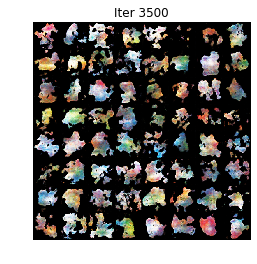

[269/1000][4/13]	Loss_D: -0.2866	Loss_G: -0.3530
[269/1000][5/13]	Loss_D: -0.2907	Loss_G: -0.3561
[269/1000][6/13]	Loss_D: -0.2862	Loss_G: -0.3518
[269/1000][7/13]	Loss_D: -0.2781	Loss_G: -0.3760
[269/1000][8/13]	Loss_D: -0.2397	Loss_G: -0.3430
[269/1000][9/13]	Loss_D: -0.2071	Loss_G: -0.5211
[269/1000][10/13]	Loss_D: -0.1761	Loss_G: -0.3500
[269/1000][11/13]	Loss_D: -0.2749	Loss_G: -0.3690
[269/1000][12/13]	Loss_D: -0.2835	Loss_G: -0.3592
[270/1000][0/13]	Loss_D: -0.2862	Loss_G: -0.3592
[270/1000][1/13]	Loss_D: -0.2850	Loss_G: -0.3553
[270/1000][2/13]	Loss_D: -0.2860	Loss_G: -0.3586
[270/1000][3/13]	Loss_D: -0.2823	Loss_G: -0.3658
[270/1000][4/13]	Loss_D: -0.2683	Loss_G: -0.3480
[270/1000][5/13]	Loss_D: -0.2605	Loss_G: -0.3982
[270/1000][6/13]	Loss_D: -0.1010	Loss_G: -0.3431
[270/1000][7/13]	Loss_D: -0.1988	Loss_G: -0.4729
[270/1000][8/13]	Loss_D: -0.1995	Loss_G: -0.3439
[270/1000][9/13]	Loss_D: -0.1855	Loss_G: -0.4747
[270/1000][10/13]	Loss_D: -0.2550	Loss_G: -0.3455
[270/1000][11/13

[282/1000][2/13]	Loss_D: -0.2270	Loss_G: -0.4082
[282/1000][3/13]	Loss_D: -0.2383	Loss_G: -0.3450
[282/1000][4/13]	Loss_D: -0.2889	Loss_G: -0.3600
[282/1000][5/13]	Loss_D: -0.2869	Loss_G: -0.3596
[282/1000][6/13]	Loss_D: -0.2843	Loss_G: -0.3662
[282/1000][7/13]	Loss_D: -0.2763	Loss_G: -0.3510
[282/1000][8/13]	Loss_D: -0.2840	Loss_G: -0.3649
[282/1000][9/13]	Loss_D: -0.2842	Loss_G: -0.3528
[282/1000][10/13]	Loss_D: -0.2763	Loss_G: -0.3646
[282/1000][11/13]	Loss_D: -0.2779	Loss_G: -0.3541
[282/1000][12/13]	Loss_D: -0.2281	Loss_G: -0.4618
[283/1000][0/13]	Loss_D: -0.2545	Loss_G: -0.3429
[283/1000][1/13]	Loss_D: -0.2274	Loss_G: -0.4675
[283/1000][2/13]	Loss_D: -0.2225	Loss_G: -0.3404
[283/1000][3/13]	Loss_D: -0.2663	Loss_G: -0.3768
[283/1000][4/13]	Loss_D: -0.2181	Loss_G: -0.3442
[283/1000][5/13]	Loss_D: -0.2015	Loss_G: -0.4362
[283/1000][6/13]	Loss_D: -0.2367	Loss_G: -0.3400
[283/1000][7/13]	Loss_D: -0.2831	Loss_G: -0.3608
[283/1000][8/13]	Loss_D: -0.2927	Loss_G: -0.3529
[283/1000][9/13]	

[295/1000][0/13]	Loss_D: -0.2772	Loss_G: -0.3821
[295/1000][1/13]	Loss_D: -0.1557	Loss_G: -0.3530
[295/1000][2/13]	Loss_D: -0.2247	Loss_G: -0.4245
[295/1000][3/13]	Loss_D: -0.1739	Loss_G: -0.3415
[295/1000][4/13]	Loss_D: -0.1911	Loss_G: -0.4278
[295/1000][5/13]	Loss_D: -0.2488	Loss_G: -0.3479
[295/1000][6/13]	Loss_D: -0.2860	Loss_G: -0.3588
[295/1000][7/13]	Loss_D: -0.2905	Loss_G: -0.3532
[295/1000][8/13]	Loss_D: -0.2831	Loss_G: -0.3684
[295/1000][9/13]	Loss_D: -0.2244	Loss_G: -0.3410
[295/1000][10/13]	Loss_D: -0.2546	Loss_G: -0.3896
[295/1000][11/13]	Loss_D: -0.2875	Loss_G: -0.3521
[295/1000][12/13]	Loss_D: -0.2900	Loss_G: -0.3573
[296/1000][0/13]	Loss_D: -0.2912	Loss_G: -0.3607
[296/1000][1/13]	Loss_D: -0.2780	Loss_G: -0.3510
[296/1000][2/13]	Loss_D: -0.2542	Loss_G: -0.4027
[296/1000][3/13]	Loss_D: -0.1569	Loss_G: -0.3473
[296/1000][4/13]	Loss_D: -0.2337	Loss_G: -0.3435
[296/1000][5/13]	Loss_D: -0.2392	Loss_G: -0.4080
[296/1000][6/13]	Loss_D: -0.2212	Loss_G: -0.3426
[296/1000][7/13]	

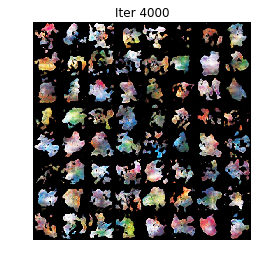

[307/1000][10/13]	Loss_D: -0.1750	Loss_G: -0.3449
[307/1000][11/13]	Loss_D: -0.2461	Loss_G: -0.3442
[307/1000][12/13]	Loss_D: -0.2817	Loss_G: -0.3667
[308/1000][0/13]	Loss_D: -0.2774	Loss_G: -0.3557
[308/1000][1/13]	Loss_D: -0.2915	Loss_G: -0.3528
[308/1000][2/13]	Loss_D: -0.2666	Loss_G: -0.3844
[308/1000][3/13]	Loss_D: -0.2513	Loss_G: -0.3444
[308/1000][4/13]	Loss_D: -0.2411	Loss_G: -0.3521
[308/1000][5/13]	Loss_D: -0.2801	Loss_G: -0.3724
[308/1000][6/13]	Loss_D: -0.2515	Loss_G: -0.3442
[308/1000][7/13]	Loss_D: -0.1802	Loss_G: -0.6132
[308/1000][8/13]	Loss_D: -0.2594	Loss_G: -0.3884
[308/1000][9/13]	Loss_D: -0.2434	Loss_G: -0.3447
[308/1000][10/13]	Loss_D: -0.2169	Loss_G: -0.6198
[308/1000][11/13]	Loss_D: -0.2303	Loss_G: -0.3683
[308/1000][12/13]	Loss_D: -0.2797	Loss_G: -0.3564
[309/1000][0/13]	Loss_D: -0.2837	Loss_G: -0.3574
[309/1000][1/13]	Loss_D: -0.2798	Loss_G: -0.3691
[309/1000][2/13]	Loss_D: -0.2692	Loss_G: -0.3502
[309/1000][3/13]	Loss_D: -0.1782	Loss_G: -0.4807
[309/1000][4/1

[320/1000][8/13]	Loss_D: -0.2755	Loss_G: -0.3469
[320/1000][9/13]	Loss_D: -0.1822	Loss_G: -0.4770
[320/1000][10/13]	Loss_D: -0.1306	Loss_G: -0.3499
[320/1000][11/13]	Loss_D: -0.2812	Loss_G: -0.3612
[320/1000][12/13]	Loss_D: -0.2901	Loss_G: -0.3516
[321/1000][0/13]	Loss_D: -0.2854	Loss_G: -0.3603
[321/1000][1/13]	Loss_D: -0.2847	Loss_G: -0.3573
[321/1000][2/13]	Loss_D: -0.2823	Loss_G: -0.3699
[321/1000][3/13]	Loss_D: -0.2507	Loss_G: -0.3422
[321/1000][4/13]	Loss_D: -0.2525	Loss_G: -0.3999
[321/1000][5/13]	Loss_D: -0.2590	Loss_G: -0.3426
[321/1000][6/13]	Loss_D: -0.2385	Loss_G: -0.4215
[321/1000][7/13]	Loss_D: -0.2144	Loss_G: -0.3440
[321/1000][8/13]	Loss_D: -0.2824	Loss_G: -0.3663
[321/1000][9/13]	Loss_D: -0.2846	Loss_G: -0.3535
[321/1000][10/13]	Loss_D: -0.2709	Loss_G: -0.3763
[321/1000][11/13]	Loss_D: -0.2747	Loss_G: -0.3481
[321/1000][12/13]	Loss_D: -0.2886	Loss_G: -0.3631
[322/1000][0/13]	Loss_D: -0.2862	Loss_G: -0.3535
[322/1000][1/13]	Loss_D: -0.2911	Loss_G: -0.3572
[322/1000][2/1

[333/1000][6/13]	Loss_D: -0.2280	Loss_G: -0.3951
[333/1000][7/13]	Loss_D: -0.2859	Loss_G: -0.3528
[333/1000][8/13]	Loss_D: -0.2646	Loss_G: -0.3925
[333/1000][9/13]	Loss_D: -0.2684	Loss_G: -0.3485
[333/1000][10/13]	Loss_D: -0.2751	Loss_G: -0.3746
[333/1000][11/13]	Loss_D: -0.2812	Loss_G: -0.3558
[333/1000][12/13]	Loss_D: -0.2910	Loss_G: -0.3567
[334/1000][0/13]	Loss_D: -0.2873	Loss_G: -0.3629
[334/1000][1/13]	Loss_D: -0.2927	Loss_G: -0.3552
[334/1000][2/13]	Loss_D: -0.2862	Loss_G: -0.3632
[334/1000][3/13]	Loss_D: -0.2690	Loss_G: -0.3905
[334/1000][4/13]	Loss_D: -0.1893	Loss_G: -0.3517
[334/1000][5/13]	Loss_D: -0.1811	Loss_G: -0.5061
[334/1000][6/13]	Loss_D: -0.1212	Loss_G: -0.3439
[334/1000][7/13]	Loss_D: -0.2037	Loss_G: -0.4734
[334/1000][8/13]	Loss_D: -0.2240	Loss_G: -0.3443
[334/1000][9/13]	Loss_D: -0.2607	Loss_G: -0.3745
[334/1000][10/13]	Loss_D: -0.2575	Loss_G: -0.3438
[334/1000][11/13]	Loss_D: -0.2905	Loss_G: -0.3554
[334/1000][12/13]	Loss_D: -0.2793	Loss_G: -0.3650
[335/1000][0/1

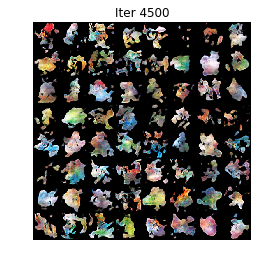

[346/1000][3/13]	Loss_D: -0.1290	Loss_G: -0.3478
[346/1000][4/13]	Loss_D: -0.2595	Loss_G: -0.3836
[346/1000][5/13]	Loss_D: -0.2636	Loss_G: -0.3473
[346/1000][6/13]	Loss_D: -0.2806	Loss_G: -0.3658
[346/1000][7/13]	Loss_D: -0.2503	Loss_G: -0.3486
[346/1000][8/13]	Loss_D: -0.2589	Loss_G: -0.3831
[346/1000][9/13]	Loss_D: -0.2609	Loss_G: -0.3448
[346/1000][10/13]	Loss_D: -0.2425	Loss_G: -0.4117
[346/1000][11/13]	Loss_D: -0.2632	Loss_G: -0.3473
[346/1000][12/13]	Loss_D: -0.2776	Loss_G: -0.3651
[347/1000][0/13]	Loss_D: -0.2870	Loss_G: -0.3578
[347/1000][1/13]	Loss_D: -0.2773	Loss_G: -0.3664
[347/1000][2/13]	Loss_D: -0.2732	Loss_G: -0.3471
[347/1000][3/13]	Loss_D: -0.2238	Loss_G: -0.4203
[347/1000][4/13]	Loss_D: -0.1840	Loss_G: -0.3504
[347/1000][5/13]	Loss_D: -0.2792	Loss_G: -0.3604
[347/1000][6/13]	Loss_D: -0.2268	Loss_G: -0.4364
[347/1000][7/13]	Loss_D: -0.2464	Loss_G: -0.3435
[347/1000][8/13]	Loss_D: -0.2733	Loss_G: -0.3759
[347/1000][9/13]	Loss_D: -0.2698	Loss_G: -0.3525
[347/1000][10/13]

[359/1000][1/13]	Loss_D: -0.2822	Loss_G: -0.3519
[359/1000][2/13]	Loss_D: -0.2660	Loss_G: -0.3896
[359/1000][3/13]	Loss_D: -0.2097	Loss_G: -0.3454
[359/1000][4/13]	Loss_D: -0.2719	Loss_G: -0.3927
[359/1000][5/13]	Loss_D: -0.2551	Loss_G: -0.3442
[359/1000][6/13]	Loss_D: -0.1797	Loss_G: -0.4699
[359/1000][7/13]	Loss_D: -0.1746	Loss_G: -0.3498
[359/1000][8/13]	Loss_D: -0.2789	Loss_G: -0.3677
[359/1000][9/13]	Loss_D: -0.2789	Loss_G: -0.3573
[359/1000][10/13]	Loss_D: -0.2805	Loss_G: -0.3659
[359/1000][11/13]	Loss_D: -0.2531	Loss_G: -0.3497
[359/1000][12/13]	Loss_D: -0.2544	Loss_G: -0.3922
[360/1000][0/13]	Loss_D: -0.2844	Loss_G: -0.3504
[360/1000][1/13]	Loss_D: -0.2825	Loss_G: -0.3666
[360/1000][2/13]	Loss_D: -0.2851	Loss_G: -0.3530
[360/1000][3/13]	Loss_D: -0.2021	Loss_G: -0.4586
[360/1000][4/13]	Loss_D: -0.2733	Loss_G: -0.3535
[360/1000][5/13]	Loss_D: -0.2637	Loss_G: -0.3958
[360/1000][6/13]	Loss_D: -0.1332	Loss_G: -0.3458
[360/1000][7/13]	Loss_D: -0.2148	Loss_G: -0.4138
[360/1000][8/13]	

[372/1000][0/13]	Loss_D: -0.2684	Loss_G: -0.3946
[372/1000][1/13]	Loss_D: -0.2640	Loss_G: -0.3475
[372/1000][2/13]	Loss_D: -0.2439	Loss_G: -0.3984
[372/1000][3/13]	Loss_D: -0.2661	Loss_G: -0.3513
[372/1000][4/13]	Loss_D: -0.2746	Loss_G: -0.3736
[372/1000][5/13]	Loss_D: -0.2765	Loss_G: -0.3495
[372/1000][6/13]	Loss_D: -0.2704	Loss_G: -0.3819
[372/1000][7/13]	Loss_D: -0.2489	Loss_G: -0.3487
[372/1000][8/13]	Loss_D: -0.2549	Loss_G: -0.4417
[372/1000][9/13]	Loss_D: -0.1605	Loss_G: -0.3463
[372/1000][10/13]	Loss_D: -0.2500	Loss_G: -0.3916
[372/1000][11/13]	Loss_D: -0.2643	Loss_G: -0.3514
[372/1000][12/13]	Loss_D: -0.2431	Loss_G: -0.4181
[373/1000][0/13]	Loss_D: -0.2440	Loss_G: -0.3404
[373/1000][1/13]	Loss_D: -0.2689	Loss_G: -0.3760
[373/1000][2/13]	Loss_D: -0.2813	Loss_G: -0.3559
[373/1000][3/13]	Loss_D: -0.2387	Loss_G: -0.4299
[373/1000][4/13]	Loss_D: -0.1576	Loss_G: -0.3512
[373/1000][5/13]	Loss_D: -0.2650	Loss_G: -0.3712
[373/1000][6/13]	Loss_D: -0.2747	Loss_G: -0.3535
[373/1000][7/13]	

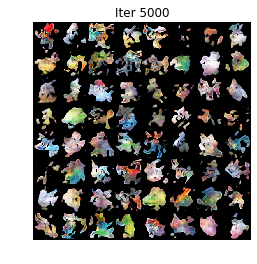

[384/1000][9/13]	Loss_D: -0.2697	Loss_G: -0.3569
[384/1000][10/13]	Loss_D: -0.2087	Loss_G: -0.5540
[384/1000][11/13]	Loss_D: -0.1822	Loss_G: -0.3463
[384/1000][12/13]	Loss_D: -0.2744	Loss_G: -0.3646
[385/1000][0/13]	Loss_D: -0.2713	Loss_G: -0.3742
[385/1000][1/13]	Loss_D: -0.2545	Loss_G: -0.3482
[385/1000][2/13]	Loss_D: -0.2125	Loss_G: -0.5502
[385/1000][3/13]	Loss_D: -0.2410	Loss_G: -0.4077
[385/1000][4/13]	Loss_D: -0.1890	Loss_G: -0.3468
[385/1000][5/13]	Loss_D: -0.2069	Loss_G: -0.5904
[385/1000][6/13]	Loss_D: -0.2285	Loss_G: -0.3451
[385/1000][7/13]	Loss_D: -0.2437	Loss_G: -0.3989
[385/1000][8/13]	Loss_D: -0.2589	Loss_G: -0.3499
[385/1000][9/13]	Loss_D: -0.2873	Loss_G: -0.3605
[385/1000][10/13]	Loss_D: -0.2768	Loss_G: -0.3666
[385/1000][11/13]	Loss_D: -0.2679	Loss_G: -0.3515
[385/1000][12/13]	Loss_D: -0.2768	Loss_G: -0.3831
[386/1000][0/13]	Loss_D: -0.2748	Loss_G: -0.3531
[386/1000][1/13]	Loss_D: -0.2395	Loss_G: -0.4556
[386/1000][2/13]	Loss_D: -0.2061	Loss_G: -0.4643
[386/1000][3/1

[397/1000][7/13]	Loss_D: -0.2360	Loss_G: -0.4473
[397/1000][8/13]	Loss_D: -0.2265	Loss_G: -0.3457
[397/1000][9/13]	Loss_D: -0.2500	Loss_G: -0.3906
[397/1000][10/13]	Loss_D: -0.2456	Loss_G: -0.3487
[397/1000][11/13]	Loss_D: -0.2598	Loss_G: -0.3825
[397/1000][12/13]	Loss_D: -0.2687	Loss_G: -0.3544
[398/1000][0/13]	Loss_D: -0.2795	Loss_G: -0.3604
[398/1000][1/13]	Loss_D: -0.2898	Loss_G: -0.3607
[398/1000][2/13]	Loss_D: -0.2716	Loss_G: -0.3819
[398/1000][3/13]	Loss_D: -0.2596	Loss_G: -0.3502
[398/1000][4/13]	Loss_D: -0.1930	Loss_G: -0.5298
[398/1000][5/13]	Loss_D: -0.2542	Loss_G: -0.3482
[398/1000][6/13]	Loss_D: -0.2347	Loss_G: -0.4381
[398/1000][7/13]	Loss_D: -0.1973	Loss_G: -0.3525
[398/1000][8/13]	Loss_D: -0.2501	Loss_G: -0.3885
[398/1000][9/13]	Loss_D: -0.2580	Loss_G: -0.3511
[398/1000][10/13]	Loss_D: -0.2547	Loss_G: -0.3931
[398/1000][11/13]	Loss_D: -0.2497	Loss_G: -0.3505
[398/1000][12/13]	Loss_D: -0.2210	Loss_G: -0.5917
[399/1000][0/13]	Loss_D: -0.2647	Loss_G: -0.3780
[399/1000][1/1

[410/1000][6/13]	Loss_D: -0.2183	Loss_G: -0.4740
[410/1000][7/13]	Loss_D: -0.2191	Loss_G: -0.3425
[410/1000][8/13]	Loss_D: -0.2465	Loss_G: -0.4035
[410/1000][9/13]	Loss_D: -0.2593	Loss_G: -0.3523
[410/1000][10/13]	Loss_D: -0.2448	Loss_G: -0.4028
[410/1000][11/13]	Loss_D: -0.2300	Loss_G: -0.3488
[410/1000][12/13]	Loss_D: -0.2490	Loss_G: -0.3944
[411/1000][0/13]	Loss_D: -0.2462	Loss_G: -0.3472
[411/1000][1/13]	Loss_D: -0.2607	Loss_G: -0.3903
[411/1000][2/13]	Loss_D: -0.2648	Loss_G: -0.3512
[411/1000][3/13]	Loss_D: -0.2306	Loss_G: -0.4156
[411/1000][4/13]	Loss_D: -0.2460	Loss_G: -0.3518
[411/1000][5/13]	Loss_D: -0.2552	Loss_G: -0.4001
[411/1000][6/13]	Loss_D: -0.2336	Loss_G: -0.3540
[411/1000][7/13]	Loss_D: -0.2264	Loss_G: -0.4314
[411/1000][8/13]	Loss_D: -0.2296	Loss_G: -0.3470
[411/1000][9/13]	Loss_D: -0.2279	Loss_G: -0.4145
[411/1000][10/13]	Loss_D: -0.2678	Loss_G: -0.3562
[411/1000][11/13]	Loss_D: -0.2680	Loss_G: -0.3733
[411/1000][12/13]	Loss_D: -0.2707	Loss_G: -0.3568
[412/1000][0/1

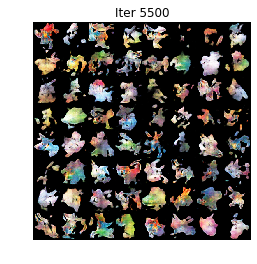

[423/1000][2/13]	Loss_D: -0.2367	Loss_G: -0.3648
[423/1000][3/13]	Loss_D: -0.2454	Loss_G: -0.4006
[423/1000][4/13]	Loss_D: -0.2576	Loss_G: -0.3509
[423/1000][5/13]	Loss_D: -0.2585	Loss_G: -0.3955
[423/1000][6/13]	Loss_D: -0.2450	Loss_G: -0.3495
[423/1000][7/13]	Loss_D: -0.2282	Loss_G: -0.4334
[423/1000][8/13]	Loss_D: -0.2329	Loss_G: -0.3503
[423/1000][9/13]	Loss_D: -0.2405	Loss_G: -0.4067
[423/1000][10/13]	Loss_D: -0.2397	Loss_G: -0.3521
[423/1000][11/13]	Loss_D: -0.2599	Loss_G: -0.3846
[423/1000][12/13]	Loss_D: -0.2515	Loss_G: -0.3539
[424/1000][0/13]	Loss_D: -0.2306	Loss_G: -0.4498
[424/1000][1/13]	Loss_D: -0.1352	Loss_G: -0.3402
[424/1000][2/13]	Loss_D: -0.2664	Loss_G: -0.3754
[424/1000][3/13]	Loss_D: -0.2609	Loss_G: -0.3514
[424/1000][4/13]	Loss_D: -0.2736	Loss_G: -0.3728
[424/1000][5/13]	Loss_D: -0.2622	Loss_G: -0.3697
[424/1000][6/13]	Loss_D: -0.2106	Loss_G: -0.5279
[424/1000][7/13]	Loss_D: -0.1905	Loss_G: -0.3470
[424/1000][8/13]	Loss_D: -0.1388	Loss_G: -0.4293
[424/1000][9/13]	

[436/1000][0/13]	Loss_D: -0.2790	Loss_G: -0.3652
[436/1000][1/13]	Loss_D: -0.2737	Loss_G: -0.3605
[436/1000][2/13]	Loss_D: -0.2635	Loss_G: -0.3863
[436/1000][3/13]	Loss_D: -0.1856	Loss_G: -0.3473
[436/1000][4/13]	Loss_D: -0.1921	Loss_G: -0.4827
[436/1000][5/13]	Loss_D: -0.1884	Loss_G: -0.3530
[436/1000][6/13]	Loss_D: -0.2217	Loss_G: -0.4094
[436/1000][7/13]	Loss_D: -0.2416	Loss_G: -0.3514
[436/1000][8/13]	Loss_D: -0.2573	Loss_G: -0.3868
[436/1000][9/13]	Loss_D: -0.2766	Loss_G: -0.3577
[436/1000][10/13]	Loss_D: -0.2365	Loss_G: -0.4101
[436/1000][11/13]	Loss_D: -0.2133	Loss_G: -0.3478
[436/1000][12/13]	Loss_D: -0.2026	Loss_G: -0.4607
[437/1000][0/13]	Loss_D: -0.2353	Loss_G: -0.3494
[437/1000][1/13]	Loss_D: -0.2676	Loss_G: -0.3785
[437/1000][2/13]	Loss_D: -0.2696	Loss_G: -0.3636
[437/1000][3/13]	Loss_D: -0.2695	Loss_G: -0.3833
[437/1000][4/13]	Loss_D: -0.2498	Loss_G: -0.3532
[437/1000][5/13]	Loss_D: -0.2169	Loss_G: -0.4344
[437/1000][6/13]	Loss_D: -0.1782	Loss_G: -0.3578
[437/1000][7/13]	

[448/1000][12/13]	Loss_D: -0.2562	Loss_G: -0.3948
[449/1000][0/13]	Loss_D: -0.2507	Loss_G: -0.3521
[449/1000][1/13]	Loss_D: -0.2454	Loss_G: -0.4049
[449/1000][2/13]	Loss_D: -0.1989	Loss_G: -0.3566
[449/1000][3/13]	Loss_D: -0.2243	Loss_G: -0.4231
[449/1000][4/13]	Loss_D: -0.2307	Loss_G: -0.3474
[449/1000][5/13]	Loss_D: -0.2671	Loss_G: -0.3787
[449/1000][6/13]	Loss_D: -0.2608	Loss_G: -0.3562
[449/1000][7/13]	Loss_D: -0.2423	Loss_G: -0.4027
[449/1000][8/13]	Loss_D: -0.2315	Loss_G: -0.3486
[449/1000][9/13]	Loss_D: -0.2486	Loss_G: -0.3922
[449/1000][10/13]	Loss_D: -0.2510	Loss_G: -0.3528
[449/1000][11/13]	Loss_D: -0.2467	Loss_G: -0.4104
[449/1000][12/13]	Loss_D: -0.2127	Loss_G: -0.3484
[450/1000][0/13]	Loss_D: -0.2393	Loss_G: -0.4123
[450/1000][1/13]	Loss_D: -0.2551	Loss_G: -0.3530
[450/1000][2/13]	Loss_D: -0.2599	Loss_G: -0.3896
[450/1000][3/13]	Loss_D: -0.2470	Loss_G: -0.3567
[450/1000][4/13]	Loss_D: -0.2659	Loss_G: -0.3856
[450/1000][5/13]	Loss_D: -0.2667	Loss_G: -0.3576
[450/1000][6/13]

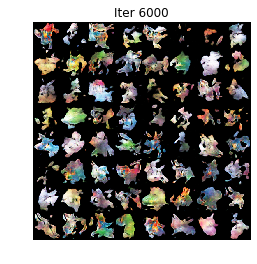

[461/1000][8/13]	Loss_D: -0.2321	Loss_G: -0.3513
[461/1000][9/13]	Loss_D: -0.2315	Loss_G: -0.5151
[461/1000][10/13]	Loss_D: -0.0960	Loss_G: -0.3498
[461/1000][11/13]	Loss_D: -0.2674	Loss_G: -0.3754
[461/1000][12/13]	Loss_D: -0.2640	Loss_G: -0.3659
[462/1000][0/13]	Loss_D: -0.2723	Loss_G: -0.3632
[462/1000][1/13]	Loss_D: -0.2696	Loss_G: -0.3703
[462/1000][2/13]	Loss_D: -0.2674	Loss_G: -0.3744
[462/1000][3/13]	Loss_D: -0.2450	Loss_G: -0.3555
[462/1000][4/13]	Loss_D: -0.1924	Loss_G: -0.4876
[462/1000][5/13]	Loss_D: -0.1505	Loss_G: -0.3587
[462/1000][6/13]	Loss_D: -0.2409	Loss_G: -0.3981
[462/1000][7/13]	Loss_D: -0.2289	Loss_G: -0.3505
[462/1000][8/13]	Loss_D: -0.2271	Loss_G: -0.4592
[462/1000][9/13]	Loss_D: -0.2137	Loss_G: -0.3492
[462/1000][10/13]	Loss_D: -0.2454	Loss_G: -0.4060
[462/1000][11/13]	Loss_D: -0.2425	Loss_G: -0.3514
[462/1000][12/13]	Loss_D: -0.2618	Loss_G: -0.3817
[463/1000][0/13]	Loss_D: -0.2571	Loss_G: -0.3555
[463/1000][1/13]	Loss_D: -0.2344	Loss_G: -0.4277
[463/1000][2/1

[474/1000][6/13]	Loss_D: -0.1651	Loss_G: -0.5008
[474/1000][7/13]	Loss_D: -0.2168	Loss_G: -0.3506
[474/1000][8/13]	Loss_D: -0.2380	Loss_G: -0.4034
[474/1000][9/13]	Loss_D: -0.2539	Loss_G: -0.3573
[474/1000][10/13]	Loss_D: -0.2476	Loss_G: -0.4018
[474/1000][11/13]	Loss_D: -0.2424	Loss_G: -0.3555
[474/1000][12/13]	Loss_D: -0.2691	Loss_G: -0.3731
[475/1000][0/13]	Loss_D: -0.2710	Loss_G: -0.3606
[475/1000][1/13]	Loss_D: -0.2685	Loss_G: -0.3735
[475/1000][2/13]	Loss_D: -0.2504	Loss_G: -0.3980
[475/1000][3/13]	Loss_D: -0.2393	Loss_G: -0.3522
[475/1000][4/13]	Loss_D: -0.2050	Loss_G: -0.5789
[475/1000][5/13]	Loss_D: -0.2649	Loss_G: -0.3667
[475/1000][6/13]	Loss_D: -0.2676	Loss_G: -0.3743
[475/1000][7/13]	Loss_D: -0.2670	Loss_G: -0.3721
[475/1000][8/13]	Loss_D: -0.2388	Loss_G: -0.4227
[475/1000][9/13]	Loss_D: -0.1718	Loss_G: -0.3432
[475/1000][10/13]	Loss_D: -0.1980	Loss_G: -0.4829
[475/1000][11/13]	Loss_D: -0.2086	Loss_G: -0.3487
[475/1000][12/13]	Loss_D: -0.2176	Loss_G: -0.4452
[476/1000][0/1

[487/1000][4/13]	Loss_D: -0.2518	Loss_G: -0.3562
[487/1000][5/13]	Loss_D: -0.2565	Loss_G: -0.3902
[487/1000][6/13]	Loss_D: -0.2457	Loss_G: -0.3521
[487/1000][7/13]	Loss_D: -0.2268	Loss_G: -0.4882
[487/1000][8/13]	Loss_D: -0.2141	Loss_G: -0.3509
[487/1000][9/13]	Loss_D: -0.2538	Loss_G: -0.3871
[487/1000][10/13]	Loss_D: -0.2392	Loss_G: -0.3523
[487/1000][11/13]	Loss_D: -0.2301	Loss_G: -0.4073
[487/1000][12/13]	Loss_D: -0.2398	Loss_G: -0.3520
[488/1000][0/13]	Loss_D: -0.2412	Loss_G: -0.3973
[488/1000][1/13]	Loss_D: -0.2517	Loss_G: -0.3549
[488/1000][2/13]	Loss_D: -0.2528	Loss_G: -0.3927
[488/1000][3/13]	Loss_D: -0.2581	Loss_G: -0.3564
[488/1000][4/13]	Loss_D: -0.2439	Loss_G: -0.4024
[488/1000][5/13]	Loss_D: -0.2099	Loss_G: -0.3525
[488/1000][6/13]	Loss_D: -0.1932	Loss_G: -0.4268
[488/1000][7/13]	Loss_D: -0.2453	Loss_G: -0.3543
[488/1000][8/13]	Loss_D: -0.2523	Loss_G: -0.3949
[488/1000][9/13]	Loss_D: -0.2453	Loss_G: -0.3525
[488/1000][10/13]	Loss_D: -0.2477	Loss_G: -0.3955
[488/1000][11/13

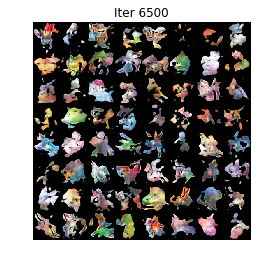

[500/1000][1/13]	Loss_D: -0.2624	Loss_G: -0.3798
[500/1000][2/13]	Loss_D: -0.2633	Loss_G: -0.3627
[500/1000][3/13]	Loss_D: -0.2300	Loss_G: -0.4317
[500/1000][4/13]	Loss_D: -0.1384	Loss_G: -0.3592
[500/1000][5/13]	Loss_D: -0.1943	Loss_G: -0.4423
[500/1000][6/13]	Loss_D: -0.2361	Loss_G: -0.3564
[500/1000][7/13]	Loss_D: -0.2489	Loss_G: -0.3948
[500/1000][8/13]	Loss_D: -0.2583	Loss_G: -0.3585
[500/1000][9/13]	Loss_D: -0.2515	Loss_G: -0.3953
[500/1000][10/13]	Loss_D: -0.2399	Loss_G: -0.3529
[500/1000][11/13]	Loss_D: -0.2199	Loss_G: -0.4352
[500/1000][12/13]	Loss_D: -0.2219	Loss_G: -0.3533
[501/1000][0/13]	Loss_D: -0.2568	Loss_G: -0.3907
[501/1000][1/13]	Loss_D: -0.2511	Loss_G: -0.3545
[501/1000][2/13]	Loss_D: -0.2389	Loss_G: -0.4138
[501/1000][3/13]	Loss_D: -0.2242	Loss_G: -0.3538
[501/1000][4/13]	Loss_D: -0.2552	Loss_G: -0.4007
[501/1000][5/13]	Loss_D: -0.2349	Loss_G: -0.3528
[501/1000][6/13]	Loss_D: -0.2423	Loss_G: -0.4174
[501/1000][7/13]	Loss_D: -0.1626	Loss_G: -0.3527
[501/1000][8/13]	

[513/1000][0/13]	Loss_D: -0.2448	Loss_G: -0.3988
[513/1000][1/13]	Loss_D: -0.2265	Loss_G: -0.3554
[513/1000][2/13]	Loss_D: -0.2642	Loss_G: -0.3818
[513/1000][3/13]	Loss_D: -0.2635	Loss_G: -0.3598
[513/1000][4/13]	Loss_D: -0.2348	Loss_G: -0.4239
[513/1000][5/13]	Loss_D: -0.2207	Loss_G: -0.3539
[513/1000][6/13]	Loss_D: -0.2516	Loss_G: -0.3812
[513/1000][7/13]	Loss_D: -0.2428	Loss_G: -0.3522
[513/1000][8/13]	Loss_D: -0.2356	Loss_G: -0.4125
[513/1000][9/13]	Loss_D: -0.2238	Loss_G: -0.3522
[513/1000][10/13]	Loss_D: -0.2422	Loss_G: -0.3967
[513/1000][11/13]	Loss_D: -0.2231	Loss_G: -0.3528
[513/1000][12/13]	Loss_D: -0.2333	Loss_G: -0.4093
[514/1000][0/13]	Loss_D: -0.1911	Loss_G: -0.3549
[514/1000][1/13]	Loss_D: -0.2471	Loss_G: -0.3949
[514/1000][2/13]	Loss_D: -0.2473	Loss_G: -0.3589
[514/1000][3/13]	Loss_D: -0.2582	Loss_G: -0.3906
[514/1000][4/13]	Loss_D: -0.2252	Loss_G: -0.3523
[514/1000][5/13]	Loss_D: -0.2197	Loss_G: -0.4232
[514/1000][6/13]	Loss_D: -0.2318	Loss_G: -0.3509
[514/1000][7/13]	

[525/1000][11/13]	Loss_D: -0.2228	Loss_G: -0.3539
[525/1000][12/13]	Loss_D: -0.2452	Loss_G: -0.3857
[526/1000][0/13]	Loss_D: -0.2410	Loss_G: -0.3600
[526/1000][1/13]	Loss_D: -0.2256	Loss_G: -0.4207
[526/1000][2/13]	Loss_D: -0.2493	Loss_G: -0.3568
[526/1000][3/13]	Loss_D: -0.2580	Loss_G: -0.3910
[526/1000][4/13]	Loss_D: -0.2502	Loss_G: -0.3562
[526/1000][5/13]	Loss_D: -0.2119	Loss_G: -0.4581
[526/1000][6/13]	Loss_D: -0.2212	Loss_G: -0.3510
[526/1000][7/13]	Loss_D: -0.2500	Loss_G: -0.3924
[526/1000][8/13]	Loss_D: -0.2369	Loss_G: -0.3560
[526/1000][9/13]	Loss_D: -0.2511	Loss_G: -0.3927
[526/1000][10/13]	Loss_D: -0.2351	Loss_G: -0.3518
[526/1000][11/13]	Loss_D: -0.2210	Loss_G: -0.4079
[526/1000][12/13]	Loss_D: -0.2170	Loss_G: -0.3522
[527/1000][0/13]	Loss_D: -0.2466	Loss_G: -0.3957
[527/1000][1/13]	Loss_D: -0.2401	Loss_G: -0.3577
[527/1000][2/13]	Loss_D: -0.2466	Loss_G: -0.4122
[527/1000][3/13]	Loss_D: -0.2297	Loss_G: -0.3540
[527/1000][4/13]	Loss_D: -0.2409	Loss_G: -0.4055
[527/1000][5/13

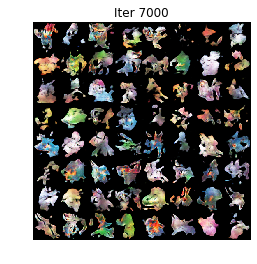

[538/1000][7/13]	Loss_D: -0.2512	Loss_G: -0.3610
[538/1000][8/13]	Loss_D: -0.2335	Loss_G: -0.4145
[538/1000][9/13]	Loss_D: -0.2266	Loss_G: -0.3566
[538/1000][10/13]	Loss_D: -0.2357	Loss_G: -0.4046
[538/1000][11/13]	Loss_D: -0.2216	Loss_G: -0.3542
[538/1000][12/13]	Loss_D: -0.2334	Loss_G: -0.4218
[539/1000][0/13]	Loss_D: -0.2239	Loss_G: -0.3521
[539/1000][1/13]	Loss_D: -0.2515	Loss_G: -0.3835
[539/1000][2/13]	Loss_D: -0.2205	Loss_G: -0.3611
[539/1000][3/13]	Loss_D: -0.2583	Loss_G: -0.3857
[539/1000][4/13]	Loss_D: -0.2401	Loss_G: -0.3588
[539/1000][5/13]	Loss_D: -0.2346	Loss_G: -0.4035
[539/1000][6/13]	Loss_D: -0.2138	Loss_G: -0.3504
[539/1000][7/13]	Loss_D: -0.2257	Loss_G: -0.4228
[539/1000][8/13]	Loss_D: -0.2416	Loss_G: -0.3571
[539/1000][9/13]	Loss_D: -0.2400	Loss_G: -0.4026
[539/1000][10/13]	Loss_D: -0.2266	Loss_G: -0.3558
[539/1000][11/13]	Loss_D: -0.2656	Loss_G: -0.3773
[539/1000][12/13]	Loss_D: -0.2632	Loss_G: -0.3668
[540/1000][0/13]	Loss_D: -0.2556	Loss_G: -0.3960
[540/1000][1/1

[551/1000][5/13]	Loss_D: -0.2375	Loss_G: -0.4053
[551/1000][6/13]	Loss_D: -0.2011	Loss_G: -0.3677
[551/1000][7/13]	Loss_D: -0.2227	Loss_G: -0.4147
[551/1000][8/13]	Loss_D: -0.2314	Loss_G: -0.3511
[551/1000][9/13]	Loss_D: -0.1862	Loss_G: -0.4758
[551/1000][10/13]	Loss_D: -0.2516	Loss_G: -0.3588
[551/1000][11/13]	Loss_D: -0.2477	Loss_G: -0.4023
[551/1000][12/13]	Loss_D: -0.2201	Loss_G: -0.3523
[552/1000][0/13]	Loss_D: -0.2548	Loss_G: -0.3909
[552/1000][1/13]	Loss_D: -0.2434	Loss_G: -0.3562
[552/1000][2/13]	Loss_D: -0.2378	Loss_G: -0.3998
[552/1000][3/13]	Loss_D: -0.1994	Loss_G: -0.3606
[552/1000][4/13]	Loss_D: -0.2251	Loss_G: -0.4131
[552/1000][5/13]	Loss_D: -0.2301	Loss_G: -0.3546
[552/1000][6/13]	Loss_D: -0.1810	Loss_G: -0.5073
[552/1000][7/13]	Loss_D: -0.2463	Loss_G: -0.3568
[552/1000][8/13]	Loss_D: -0.2426	Loss_G: -0.4034
[552/1000][9/13]	Loss_D: -0.2277	Loss_G: -0.3577
[552/1000][10/13]	Loss_D: -0.1970	Loss_G: -0.4658
[552/1000][11/13]	Loss_D: -0.2242	Loss_G: -0.3561
[552/1000][12/1

[564/1000][3/13]	Loss_D: -0.2340	Loss_G: -0.4226
[564/1000][4/13]	Loss_D: -0.2190	Loss_G: -0.3587
[564/1000][5/13]	Loss_D: -0.2673	Loss_G: -0.3796
[564/1000][6/13]	Loss_D: -0.2563	Loss_G: -0.3643
[564/1000][7/13]	Loss_D: -0.2420	Loss_G: -0.4126
[564/1000][8/13]	Loss_D: -0.2014	Loss_G: -0.3517
[564/1000][9/13]	Loss_D: -0.2040	Loss_G: -0.4754
[564/1000][10/13]	Loss_D: -0.1486	Loss_G: -0.3496
[564/1000][11/13]	Loss_D: -0.2335	Loss_G: -0.3932
[564/1000][12/13]	Loss_D: -0.2494	Loss_G: -0.3619
[565/1000][0/13]	Loss_D: -0.2330	Loss_G: -0.4132
[565/1000][1/13]	Loss_D: -0.2491	Loss_G: -0.3593
[565/1000][2/13]	Loss_D: -0.2406	Loss_G: -0.4064
[565/1000][3/13]	Loss_D: -0.2204	Loss_G: -0.3550
[565/1000][4/13]	Loss_D: -0.2190	Loss_G: -0.4590
[565/1000][5/13]	Loss_D: -0.2380	Loss_G: -0.3548
[565/1000][6/13]	Loss_D: -0.2516	Loss_G: -0.3894
[565/1000][7/13]	Loss_D: -0.2369	Loss_G: -0.3530
[565/1000][8/13]	Loss_D: -0.2204	Loss_G: -0.4296
[565/1000][9/13]	Loss_D: -0.2091	Loss_G: -0.3562
[565/1000][10/13]

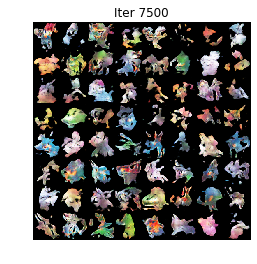

[577/1000][0/13]	Loss_D: -0.2433	Loss_G: -0.3970
[577/1000][1/13]	Loss_D: -0.2276	Loss_G: -0.3553
[577/1000][2/13]	Loss_D: -0.2435	Loss_G: -0.3903
[577/1000][3/13]	Loss_D: -0.2475	Loss_G: -0.3578
[577/1000][4/13]	Loss_D: -0.2421	Loss_G: -0.4119
[577/1000][5/13]	Loss_D: -0.2261	Loss_G: -0.3528
[577/1000][6/13]	Loss_D: -0.1931	Loss_G: -0.5271
[577/1000][7/13]	Loss_D: -0.2373	Loss_G: -0.3580
[577/1000][8/13]	Loss_D: -0.2370	Loss_G: -0.4173
[577/1000][9/13]	Loss_D: -0.2396	Loss_G: -0.3565
[577/1000][10/13]	Loss_D: -0.2199	Loss_G: -0.4232
[577/1000][11/13]	Loss_D: -0.2081	Loss_G: -0.3567
[577/1000][12/13]	Loss_D: -0.2098	Loss_G: -0.4230
[578/1000][0/13]	Loss_D: -0.2452	Loss_G: -0.3635
[578/1000][1/13]	Loss_D: -0.2567	Loss_G: -0.3863
[578/1000][2/13]	Loss_D: -0.2551	Loss_G: -0.3619
[578/1000][3/13]	Loss_D: -0.2154	Loss_G: -0.4712
[578/1000][4/13]	Loss_D: -0.1661	Loss_G: -0.3507
[578/1000][5/13]	Loss_D: -0.2393	Loss_G: -0.3971
[578/1000][6/13]	Loss_D: -0.2377	Loss_G: -0.3582
[578/1000][7/13]	

[589/1000][11/13]	Loss_D: -0.1992	Loss_G: -0.3533
[589/1000][12/13]	Loss_D: -0.2359	Loss_G: -0.4074
[590/1000][0/13]	Loss_D: -0.2449	Loss_G: -0.3595
[590/1000][1/13]	Loss_D: -0.2478	Loss_G: -0.4029
[590/1000][2/13]	Loss_D: -0.2308	Loss_G: -0.3593
[590/1000][3/13]	Loss_D: -0.2361	Loss_G: -0.3907
[590/1000][4/13]	Loss_D: -0.2445	Loss_G: -0.3599
[590/1000][5/13]	Loss_D: -0.2267	Loss_G: -0.4253
[590/1000][6/13]	Loss_D: -0.2229	Loss_G: -0.3577
[590/1000][7/13]	Loss_D: -0.2044	Loss_G: -0.4411
[590/1000][8/13]	Loss_D: -0.1843	Loss_G: -0.3560
[590/1000][9/13]	Loss_D: -0.2222	Loss_G: -0.4039
[590/1000][10/13]	Loss_D: -0.2407	Loss_G: -0.3600
[590/1000][11/13]	Loss_D: -0.2368	Loss_G: -0.4109
[590/1000][12/13]	Loss_D: -0.2406	Loss_G: -0.3583
[591/1000][0/13]	Loss_D: -0.2515	Loss_G: -0.3903
[591/1000][1/13]	Loss_D: -0.2377	Loss_G: -0.3588
[591/1000][2/13]	Loss_D: -0.2089	Loss_G: -0.4452
[591/1000][3/13]	Loss_D: -0.1877	Loss_G: -0.3579
[591/1000][4/13]	Loss_D: -0.2378	Loss_G: -0.4088
[591/1000][5/13

[602/1000][9/13]	Loss_D: -0.2211	Loss_G: -0.3561
[602/1000][10/13]	Loss_D: -0.2527	Loss_G: -0.3955
[602/1000][11/13]	Loss_D: -0.2189	Loss_G: -0.3535
[602/1000][12/13]	Loss_D: -0.2492	Loss_G: -0.3929
[603/1000][0/13]	Loss_D: -0.2444	Loss_G: -0.3595
[603/1000][1/13]	Loss_D: -0.2486	Loss_G: -0.4037
[603/1000][2/13]	Loss_D: -0.2362	Loss_G: -0.3552
[603/1000][3/13]	Loss_D: -0.2360	Loss_G: -0.4044
[603/1000][4/13]	Loss_D: -0.2232	Loss_G: -0.3547
[603/1000][5/13]	Loss_D: -0.2203	Loss_G: -0.4046
[603/1000][6/13]	Loss_D: -0.2293	Loss_G: -0.3577
[603/1000][7/13]	Loss_D: -0.2404	Loss_G: -0.4049
[603/1000][8/13]	Loss_D: -0.2333	Loss_G: -0.4160
[603/1000][9/13]	Loss_D: -0.2345	Loss_G: -0.3548
[603/1000][10/13]	Loss_D: -0.1433	Loss_G: -0.4823
[603/1000][11/13]	Loss_D: -0.2107	Loss_G: -0.3555
[603/1000][12/13]	Loss_D: -0.2369	Loss_G: -0.3974
[604/1000][0/13]	Loss_D: -0.2319	Loss_G: -0.3582
[604/1000][1/13]	Loss_D: -0.2455	Loss_G: -0.3981
[604/1000][2/13]	Loss_D: -0.2246	Loss_G: -0.3569
[604/1000][3/1

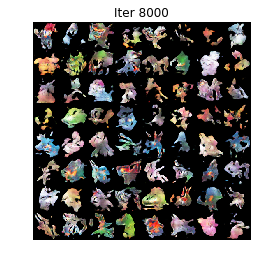

[615/1000][6/13]	Loss_D: -0.2287	Loss_G: -0.4217
[615/1000][7/13]	Loss_D: -0.2157	Loss_G: -0.3661
[615/1000][8/13]	Loss_D: -0.2030	Loss_G: -0.4562
[615/1000][9/13]	Loss_D: -0.2056	Loss_G: -0.3618
[615/1000][10/13]	Loss_D: -0.2556	Loss_G: -0.3842
[615/1000][11/13]	Loss_D: -0.2383	Loss_G: -0.3610
[615/1000][12/13]	Loss_D: -0.2118	Loss_G: -0.4335
[616/1000][0/13]	Loss_D: -0.2004	Loss_G: -0.3579
[616/1000][1/13]	Loss_D: -0.2534	Loss_G: -0.3826
[616/1000][2/13]	Loss_D: -0.2587	Loss_G: -0.3595
[616/1000][3/13]	Loss_D: -0.2519	Loss_G: -0.3916
[616/1000][4/13]	Loss_D: -0.2562	Loss_G: -0.3599
[616/1000][5/13]	Loss_D: -0.2291	Loss_G: -0.4429
[616/1000][6/13]	Loss_D: -0.1810	Loss_G: -0.3589
[616/1000][7/13]	Loss_D: -0.2210	Loss_G: -0.4149
[616/1000][8/13]	Loss_D: -0.2183	Loss_G: -0.3563
[616/1000][9/13]	Loss_D: -0.2272	Loss_G: -0.4292
[616/1000][10/13]	Loss_D: -0.2323	Loss_G: -0.3631
[616/1000][11/13]	Loss_D: -0.2515	Loss_G: -0.3854
[616/1000][12/13]	Loss_D: -0.2316	Loss_G: -0.3616
[617/1000][0/1

[628/1000][4/13]	Loss_D: -0.2404	Loss_G: -0.4041
[628/1000][5/13]	Loss_D: -0.2108	Loss_G: -0.3586
[628/1000][6/13]	Loss_D: -0.1623	Loss_G: -0.4614
[628/1000][7/13]	Loss_D: -0.2047	Loss_G: -0.3593
[628/1000][8/13]	Loss_D: -0.2486	Loss_G: -0.3975
[628/1000][9/13]	Loss_D: -0.2402	Loss_G: -0.3589
[628/1000][10/13]	Loss_D: -0.2456	Loss_G: -0.3958
[628/1000][11/13]	Loss_D: -0.2394	Loss_G: -0.3606
[628/1000][12/13]	Loss_D: -0.2563	Loss_G: -0.3846
[629/1000][0/13]	Loss_D: -0.2461	Loss_G: -0.3607
[629/1000][1/13]	Loss_D: -0.2279	Loss_G: -0.4134
[629/1000][2/13]	Loss_D: -0.2208	Loss_G: -0.3582
[629/1000][3/13]	Loss_D: -0.1759	Loss_G: -0.4685
[629/1000][4/13]	Loss_D: -0.2300	Loss_G: -0.3559
[629/1000][5/13]	Loss_D: -0.2414	Loss_G: -0.4063
[629/1000][6/13]	Loss_D: -0.2394	Loss_G: -0.3603
[629/1000][7/13]	Loss_D: -0.2486	Loss_G: -0.3898
[629/1000][8/13]	Loss_D: -0.2305	Loss_G: -0.3582
[629/1000][9/13]	Loss_D: -0.2213	Loss_G: -0.4170
[629/1000][10/13]	Loss_D: -0.2101	Loss_G: -0.3585
[629/1000][11/13

[641/1000][2/13]	Loss_D: -0.2566	Loss_G: -0.3621
[641/1000][3/13]	Loss_D: -0.2356	Loss_G: -0.4131
[641/1000][4/13]	Loss_D: -0.1778	Loss_G: -0.3551
[641/1000][5/13]	Loss_D: -0.2090	Loss_G: -0.4775
[641/1000][6/13]	Loss_D: -0.2060	Loss_G: -0.3544
[641/1000][7/13]	Loss_D: -0.2350	Loss_G: -0.3980
[641/1000][8/13]	Loss_D: -0.2214	Loss_G: -0.3579
[641/1000][9/13]	Loss_D: -0.2345	Loss_G: -0.4000
[641/1000][10/13]	Loss_D: -0.2217	Loss_G: -0.3640
[641/1000][11/13]	Loss_D: -0.2275	Loss_G: -0.4182
[641/1000][12/13]	Loss_D: -0.2174	Loss_G: -0.3582
[642/1000][0/13]	Loss_D: -0.2414	Loss_G: -0.3898
[642/1000][1/13]	Loss_D: -0.2490	Loss_G: -0.3628
[642/1000][2/13]	Loss_D: -0.2177	Loss_G: -0.4259
[642/1000][3/13]	Loss_D: -0.2427	Loss_G: -0.3560
[642/1000][4/13]	Loss_D: -0.2432	Loss_G: -0.3960
[642/1000][5/13]	Loss_D: -0.2438	Loss_G: -0.3573
[642/1000][6/13]	Loss_D: -0.1994	Loss_G: -0.5326
[642/1000][7/13]	Loss_D: -0.2340	Loss_G: -0.3559
[642/1000][8/13]	Loss_D: -0.2173	Loss_G: -0.4479
[642/1000][9/13]	

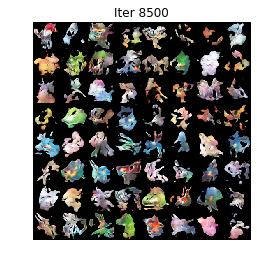

[653/1000][12/13]	Loss_D: -0.2490	Loss_G: -0.3631
[654/1000][0/13]	Loss_D: -0.2527	Loss_G: -0.3885
[654/1000][1/13]	Loss_D: -0.2442	Loss_G: -0.3601
[654/1000][2/13]	Loss_D: -0.2330	Loss_G: -0.4236
[654/1000][3/13]	Loss_D: -0.1590	Loss_G: -0.3526
[654/1000][4/13]	Loss_D: -0.2182	Loss_G: -0.4159
[654/1000][5/13]	Loss_D: -0.2144	Loss_G: -0.3610
[654/1000][6/13]	Loss_D: -0.2323	Loss_G: -0.4106
[654/1000][7/13]	Loss_D: -0.2279	Loss_G: -0.3595
[654/1000][8/13]	Loss_D: -0.2365	Loss_G: -0.4048
[654/1000][9/13]	Loss_D: -0.2330	Loss_G: -0.3598
[654/1000][10/13]	Loss_D: -0.2292	Loss_G: -0.4191
[654/1000][11/13]	Loss_D: -0.2251	Loss_G: -0.3559
[654/1000][12/13]	Loss_D: -0.2122	Loss_G: -0.4755
[655/1000][0/13]	Loss_D: -0.2556	Loss_G: -0.3607
[655/1000][1/13]	Loss_D: -0.2458	Loss_G: -0.3950
[655/1000][2/13]	Loss_D: -0.2382	Loss_G: -0.3604
[655/1000][3/13]	Loss_D: -0.2322	Loss_G: -0.4147
[655/1000][4/13]	Loss_D: -0.2230	Loss_G: -0.3605
[655/1000][5/13]	Loss_D: -0.1853	Loss_G: -0.4959
[655/1000][6/13]

[666/1000][10/13]	Loss_D: -0.2332	Loss_G: -0.4182
[666/1000][11/13]	Loss_D: -0.2271	Loss_G: -0.3585
[666/1000][12/13]	Loss_D: -0.2331	Loss_G: -0.4295
[667/1000][0/13]	Loss_D: -0.2465	Loss_G: -0.3642
[667/1000][1/13]	Loss_D: -0.2353	Loss_G: -0.4084
[667/1000][2/13]	Loss_D: -0.2332	Loss_G: -0.3601
[667/1000][3/13]	Loss_D: -0.2205	Loss_G: -0.4256
[667/1000][4/13]	Loss_D: -0.2255	Loss_G: -0.3586
[667/1000][5/13]	Loss_D: -0.2440	Loss_G: -0.3972
[667/1000][6/13]	Loss_D: -0.2283	Loss_G: -0.3595
[667/1000][7/13]	Loss_D: -0.2091	Loss_G: -0.4633
[667/1000][8/13]	Loss_D: -0.2129	Loss_G: -0.3552
[667/1000][9/13]	Loss_D: -0.2387	Loss_G: -0.3987
[667/1000][10/13]	Loss_D: -0.2294	Loss_G: -0.3609
[667/1000][11/13]	Loss_D: -0.2311	Loss_G: -0.4186
[667/1000][12/13]	Loss_D: -0.2272	Loss_G: -0.3574
[668/1000][0/13]	Loss_D: -0.2528	Loss_G: -0.3858
[668/1000][1/13]	Loss_D: -0.2603	Loss_G: -0.3761
[668/1000][2/13]	Loss_D: -0.2459	Loss_G: -0.4054
[668/1000][3/13]	Loss_D: -0.2194	Loss_G: -0.3554
[668/1000][4/1

[679/1000][8/13]	Loss_D: -0.2307	Loss_G: -0.3607
[679/1000][9/13]	Loss_D: -0.2430	Loss_G: -0.3939
[679/1000][10/13]	Loss_D: -0.2233	Loss_G: -0.3582
[679/1000][11/13]	Loss_D: -0.2270	Loss_G: -0.4090
[679/1000][12/13]	Loss_D: -0.2273	Loss_G: -0.3578
[680/1000][0/13]	Loss_D: -0.2361	Loss_G: -0.4108
[680/1000][1/13]	Loss_D: -0.2350	Loss_G: -0.3593
[680/1000][2/13]	Loss_D: -0.2246	Loss_G: -0.4168
[680/1000][3/13]	Loss_D: -0.2415	Loss_G: -0.3580
[680/1000][4/13]	Loss_D: -0.2393	Loss_G: -0.4057
[680/1000][5/13]	Loss_D: -0.2225	Loss_G: -0.3671
[680/1000][6/13]	Loss_D: -0.2231	Loss_G: -0.4103
[680/1000][7/13]	Loss_D: -0.1699	Loss_G: -0.3556
[680/1000][8/13]	Loss_D: -0.2283	Loss_G: -0.4447
[680/1000][9/13]	Loss_D: -0.2336	Loss_G: -0.3565
[680/1000][10/13]	Loss_D: -0.2261	Loss_G: -0.4092
[680/1000][11/13]	Loss_D: -0.2199	Loss_G: -0.3585
[680/1000][12/13]	Loss_D: -0.2054	Loss_G: -0.4415
[681/1000][0/13]	Loss_D: -0.2396	Loss_G: -0.3586
[681/1000][1/13]	Loss_D: -0.2342	Loss_G: -0.4015
[681/1000][2/1

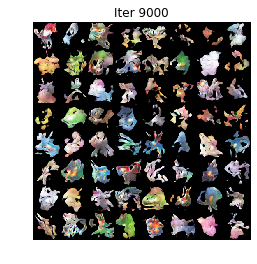

[692/1000][5/13]	Loss_D: -0.2392	Loss_G: -0.3608
[692/1000][6/13]	Loss_D: -0.2529	Loss_G: -0.3827
[692/1000][7/13]	Loss_D: -0.2480	Loss_G: -0.3642
[692/1000][8/13]	Loss_D: -0.2325	Loss_G: -0.4172
[692/1000][9/13]	Loss_D: -0.2212	Loss_G: -0.3548
[692/1000][10/13]	Loss_D: -0.2029	Loss_G: -0.4798
[692/1000][11/13]	Loss_D: -0.1784	Loss_G: -0.3526
[692/1000][12/13]	Loss_D: -0.2355	Loss_G: -0.3985
[693/1000][0/13]	Loss_D: -0.2542	Loss_G: -0.3642
[693/1000][1/13]	Loss_D: -0.2462	Loss_G: -0.3920
[693/1000][2/13]	Loss_D: -0.2227	Loss_G: -0.3565
[693/1000][3/13]	Loss_D: -0.2504	Loss_G: -0.3925
[693/1000][4/13]	Loss_D: -0.2281	Loss_G: -0.3592
[693/1000][5/13]	Loss_D: -0.2213	Loss_G: -0.4369
[693/1000][6/13]	Loss_D: -0.2102	Loss_G: -0.3573
[693/1000][7/13]	Loss_D: -0.2370	Loss_G: -0.4007
[693/1000][8/13]	Loss_D: -0.2362	Loss_G: -0.3593
[693/1000][9/13]	Loss_D: -0.2491	Loss_G: -0.3844
[693/1000][10/13]	Loss_D: -0.2451	Loss_G: -0.3642
[693/1000][11/13]	Loss_D: -0.2027	Loss_G: -0.4959
[693/1000][12/1

[705/1000][4/13]	Loss_D: -0.2282	Loss_G: -0.3616
[705/1000][5/13]	Loss_D: -0.2534	Loss_G: -0.3944
[705/1000][6/13]	Loss_D: -0.2267	Loss_G: -0.3600
[705/1000][7/13]	Loss_D: -0.2211	Loss_G: -0.4223
[705/1000][8/13]	Loss_D: -0.1946	Loss_G: -0.3537
[705/1000][9/13]	Loss_D: -0.2255	Loss_G: -0.4070
[705/1000][10/13]	Loss_D: -0.2296	Loss_G: -0.3603
[705/1000][11/13]	Loss_D: -0.2094	Loss_G: -0.4403
[705/1000][12/13]	Loss_D: -0.2062	Loss_G: -0.3573
[706/1000][0/13]	Loss_D: -0.2395	Loss_G: -0.3901
[706/1000][1/13]	Loss_D: -0.2552	Loss_G: -0.3646
[706/1000][2/13]	Loss_D: -0.2363	Loss_G: -0.4139
[706/1000][3/13]	Loss_D: -0.2153	Loss_G: -0.3590
[706/1000][4/13]	Loss_D: -0.2232	Loss_G: -0.4205
[706/1000][5/13]	Loss_D: -0.2266	Loss_G: -0.3593
[706/1000][6/13]	Loss_D: -0.2285	Loss_G: -0.4074
[706/1000][7/13]	Loss_D: -0.2396	Loss_G: -0.3622
[706/1000][8/13]	Loss_D: -0.1817	Loss_G: -0.4918
[706/1000][9/13]	Loss_D: -0.2234	Loss_G: -0.3597
[706/1000][10/13]	Loss_D: -0.2484	Loss_G: -0.3902
[706/1000][11/13

[718/1000][2/13]	Loss_D: -0.2158	Loss_G: -0.3559
[718/1000][3/13]	Loss_D: -0.2426	Loss_G: -0.4074
[718/1000][4/13]	Loss_D: -0.2334	Loss_G: -0.3578
[718/1000][5/13]	Loss_D: -0.2166	Loss_G: -0.4495
[718/1000][6/13]	Loss_D: -0.2204	Loss_G: -0.3581
[718/1000][7/13]	Loss_D: -0.2463	Loss_G: -0.4009
[718/1000][8/13]	Loss_D: -0.2323	Loss_G: -0.3618
[718/1000][9/13]	Loss_D: -0.2420	Loss_G: -0.4032
[718/1000][10/13]	Loss_D: -0.2273	Loss_G: -0.3600
[718/1000][11/13]	Loss_D: -0.2197	Loss_G: -0.4359
[718/1000][12/13]	Loss_D: -0.2313	Loss_G: -0.3601
[719/1000][0/13]	Loss_D: -0.2464	Loss_G: -0.3892
[719/1000][1/13]	Loss_D: -0.2461	Loss_G: -0.3669
[719/1000][2/13]	Loss_D: -0.2213	Loss_G: -0.4365
[719/1000][3/13]	Loss_D: -0.2050	Loss_G: -0.3579
[719/1000][4/13]	Loss_D: -0.2016	Loss_G: -0.4213
[719/1000][5/13]	Loss_D: -0.2256	Loss_G: -0.3614
[719/1000][6/13]	Loss_D: -0.2330	Loss_G: -0.4093
[719/1000][7/13]	Loss_D: -0.2461	Loss_G: -0.3645
[719/1000][8/13]	Loss_D: -0.2352	Loss_G: -0.4044
[719/1000][9/13]	

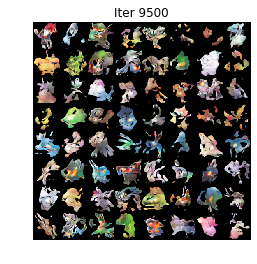

[730/1000][11/13]	Loss_D: -0.2401	Loss_G: -0.4110
[730/1000][12/13]	Loss_D: -0.2194	Loss_G: -0.3578
[731/1000][0/13]	Loss_D: -0.2579	Loss_G: -0.3823
[731/1000][1/13]	Loss_D: -0.2520	Loss_G: -0.3771
[731/1000][2/13]	Loss_D: -0.2350	Loss_G: -0.4160
[731/1000][3/13]	Loss_D: -0.2080	Loss_G: -0.3595
[731/1000][4/13]	Loss_D: -0.1644	Loss_G: -0.4819
[731/1000][5/13]	Loss_D: -0.1623	Loss_G: -0.3590
[731/1000][6/13]	Loss_D: -0.2439	Loss_G: -0.3986
[731/1000][7/13]	Loss_D: -0.2481	Loss_G: -0.3638
[731/1000][8/13]	Loss_D: -0.2282	Loss_G: -0.4101
[731/1000][9/13]	Loss_D: -0.2099	Loss_G: -0.3565
[731/1000][10/13]	Loss_D: -0.2108	Loss_G: -0.4600
[731/1000][11/13]	Loss_D: -0.1770	Loss_G: -0.3582
[731/1000][12/13]	Loss_D: -0.2430	Loss_G: -0.3942
[732/1000][0/13]	Loss_D: -0.2453	Loss_G: -0.3699
[732/1000][1/13]	Loss_D: -0.2387	Loss_G: -0.3981
[732/1000][2/13]	Loss_D: -0.2342	Loss_G: -0.3594
[732/1000][3/13]	Loss_D: -0.2432	Loss_G: -0.3947
[732/1000][4/13]	Loss_D: -0.2317	Loss_G: -0.3584
[732/1000][5/13

[743/1000][10/13]	Loss_D: -0.2356	Loss_G: -0.4102
[743/1000][11/13]	Loss_D: -0.2151	Loss_G: -0.3602
[743/1000][12/13]	Loss_D: -0.2220	Loss_G: -0.4106
[744/1000][0/13]	Loss_D: -0.2311	Loss_G: -0.3599
[744/1000][1/13]	Loss_D: -0.2506	Loss_G: -0.3881
[744/1000][2/13]	Loss_D: -0.2366	Loss_G: -0.3600
[744/1000][3/13]	Loss_D: -0.2374	Loss_G: -0.4206
[744/1000][4/13]	Loss_D: -0.1716	Loss_G: -0.3643
[744/1000][5/13]	Loss_D: -0.2195	Loss_G: -0.4219
[744/1000][6/13]	Loss_D: -0.2223	Loss_G: -0.3624
[744/1000][7/13]	Loss_D: -0.2384	Loss_G: -0.4202
[744/1000][8/13]	Loss_D: -0.2459	Loss_G: -0.3620
[744/1000][9/13]	Loss_D: -0.2407	Loss_G: -0.3978
[744/1000][10/13]	Loss_D: -0.2248	Loss_G: -0.3616
[744/1000][11/13]	Loss_D: -0.2259	Loss_G: -0.4126
[744/1000][12/13]	Loss_D: -0.2215	Loss_G: -0.3620
[745/1000][0/13]	Loss_D: -0.2474	Loss_G: -0.3937
[745/1000][1/13]	Loss_D: -0.2394	Loss_G: -0.3593
[745/1000][2/13]	Loss_D: -0.2343	Loss_G: -0.4070
[745/1000][3/13]	Loss_D: -0.2000	Loss_G: -0.3603
[745/1000][4/1

[756/1000][9/13]	Loss_D: -0.2266	Loss_G: -0.3579
[756/1000][10/13]	Loss_D: -0.2432	Loss_G: -0.3943
[756/1000][11/13]	Loss_D: -0.2394	Loss_G: -0.3641
[756/1000][12/13]	Loss_D: -0.2326	Loss_G: -0.4181
[757/1000][0/13]	Loss_D: -0.1994	Loss_G: -0.3594
[757/1000][1/13]	Loss_D: -0.2125	Loss_G: -0.4478
[757/1000][2/13]	Loss_D: -0.2302	Loss_G: -0.3595
[757/1000][3/13]	Loss_D: -0.2467	Loss_G: -0.3907
[757/1000][4/13]	Loss_D: -0.2418	Loss_G: -0.3670
[757/1000][5/13]	Loss_D: -0.2389	Loss_G: -0.4064
[757/1000][6/13]	Loss_D: -0.2316	Loss_G: -0.3610
[757/1000][7/13]	Loss_D: -0.2479	Loss_G: -0.3975
[757/1000][8/13]	Loss_D: -0.2425	Loss_G: -0.3639
[757/1000][9/13]	Loss_D: -0.2182	Loss_G: -0.4367
[757/1000][10/13]	Loss_D: -0.2054	Loss_G: -0.3538
[757/1000][11/13]	Loss_D: -0.2374	Loss_G: -0.4029
[757/1000][12/13]	Loss_D: -0.2216	Loss_G: -0.3578
[758/1000][0/13]	Loss_D: -0.2237	Loss_G: -0.4227
[758/1000][1/13]	Loss_D: -0.2370	Loss_G: -0.3639
[758/1000][2/13]	Loss_D: -0.2367	Loss_G: -0.3940
[758/1000][3/1

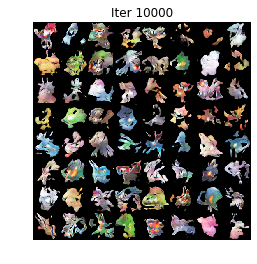

[769/1000][4/13]	Loss_D: -0.2448	Loss_G: -0.3983
[769/1000][5/13]	Loss_D: -0.2177	Loss_G: -0.3614
[769/1000][6/13]	Loss_D: -0.2315	Loss_G: -0.4091
[769/1000][7/13]	Loss_D: -0.2257	Loss_G: -0.3609
[769/1000][8/13]	Loss_D: -0.2300	Loss_G: -0.4084
[769/1000][9/13]	Loss_D: -0.2312	Loss_G: -0.3592
[769/1000][10/13]	Loss_D: -0.2173	Loss_G: -0.4408
[769/1000][11/13]	Loss_D: -0.2000	Loss_G: -0.3651
[769/1000][12/13]	Loss_D: -0.2019	Loss_G: -0.4314
[770/1000][0/13]	Loss_D: -0.2423	Loss_G: -0.3666
[770/1000][1/13]	Loss_D: -0.2431	Loss_G: -0.3979
[770/1000][2/13]	Loss_D: -0.2259	Loss_G: -0.3585
[770/1000][3/13]	Loss_D: -0.2430	Loss_G: -0.4059
[770/1000][4/13]	Loss_D: -0.2285	Loss_G: -0.3595
[770/1000][5/13]	Loss_D: -0.2269	Loss_G: -0.4248
[770/1000][6/13]	Loss_D: -0.1635	Loss_G: -0.3720
[770/1000][7/13]	Loss_D: -0.2265	Loss_G: -0.3957
[770/1000][8/13]	Loss_D: -0.2539	Loss_G: -0.3720
[770/1000][9/13]	Loss_D: -0.2331	Loss_G: -0.4146
[770/1000][10/13]	Loss_D: -0.2281	Loss_G: -0.3572
[770/1000][11/13

[782/1000][2/13]	Loss_D: -0.2286	Loss_G: -0.3621
[782/1000][3/13]	Loss_D: -0.2126	Loss_G: -0.4221
[782/1000][4/13]	Loss_D: -0.1998	Loss_G: -0.3616
[782/1000][5/13]	Loss_D: -0.2446	Loss_G: -0.3957
[782/1000][6/13]	Loss_D: -0.2385	Loss_G: -0.3642
[782/1000][7/13]	Loss_D: -0.2460	Loss_G: -0.3937
[782/1000][8/13]	Loss_D: -0.2390	Loss_G: -0.3662
[782/1000][9/13]	Loss_D: -0.2334	Loss_G: -0.4153
[782/1000][10/13]	Loss_D: -0.2229	Loss_G: -0.3598
[782/1000][11/13]	Loss_D: -0.2120	Loss_G: -0.4335
[782/1000][12/13]	Loss_D: -0.2074	Loss_G: -0.3554
[783/1000][0/13]	Loss_D: -0.2419	Loss_G: -0.3936
[783/1000][1/13]	Loss_D: -0.2471	Loss_G: -0.3620
[783/1000][2/13]	Loss_D: -0.2179	Loss_G: -0.4369
[783/1000][3/13]	Loss_D: -0.2151	Loss_G: -0.3606
[783/1000][4/13]	Loss_D: -0.2441	Loss_G: -0.3952
[783/1000][5/13]	Loss_D: -0.2437	Loss_G: -0.3646
[783/1000][6/13]	Loss_D: -0.2344	Loss_G: -0.4117
[783/1000][7/13]	Loss_D: -0.2241	Loss_G: -0.3621
[783/1000][8/13]	Loss_D: -0.2326	Loss_G: -0.4121
[783/1000][9/13]	

[795/1000][0/13]	Loss_D: -0.2430	Loss_G: -0.3646
[795/1000][1/13]	Loss_D: -0.2349	Loss_G: -0.4076
[795/1000][2/13]	Loss_D: -0.2290	Loss_G: -0.3646
[795/1000][3/13]	Loss_D: -0.2161	Loss_G: -0.4410
[795/1000][4/13]	Loss_D: -0.1962	Loss_G: -0.3602
[795/1000][5/13]	Loss_D: -0.2265	Loss_G: -0.4025
[795/1000][6/13]	Loss_D: -0.2268	Loss_G: -0.3599
[795/1000][7/13]	Loss_D: -0.2385	Loss_G: -0.4003
[795/1000][8/13]	Loss_D: -0.2240	Loss_G: -0.3609
[795/1000][9/13]	Loss_D: -0.2336	Loss_G: -0.4095
[795/1000][10/13]	Loss_D: -0.2573	Loss_G: -0.3669
[795/1000][11/13]	Loss_D: -0.2252	Loss_G: -0.4171
[795/1000][12/13]	Loss_D: -0.2189	Loss_G: -0.3634
[796/1000][0/13]	Loss_D: -0.2179	Loss_G: -0.4362
[796/1000][1/13]	Loss_D: -0.2072	Loss_G: -0.3647
[796/1000][2/13]	Loss_D: -0.2083	Loss_G: -0.4465
[796/1000][3/13]	Loss_D: -0.2027	Loss_G: -0.3665
[796/1000][4/13]	Loss_D: -0.2159	Loss_G: -0.4124
[796/1000][5/13]	Loss_D: -0.2279	Loss_G: -0.3597
[796/1000][6/13]	Loss_D: -0.2345	Loss_G: -0.4062
[796/1000][7/13]	

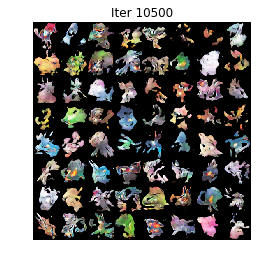

[807/1000][10/13]	Loss_D: -0.2243	Loss_G: -0.3608
[807/1000][11/13]	Loss_D: -0.2392	Loss_G: -0.4030
[807/1000][12/13]	Loss_D: -0.2284	Loss_G: -0.3696
[808/1000][0/13]	Loss_D: -0.2396	Loss_G: -0.4039
[808/1000][1/13]	Loss_D: -0.2287	Loss_G: -0.3646
[808/1000][2/13]	Loss_D: -0.2155	Loss_G: -0.4439
[808/1000][3/13]	Loss_D: -0.1616	Loss_G: -0.3709
[808/1000][4/13]	Loss_D: -0.2212	Loss_G: -0.4172
[808/1000][5/13]	Loss_D: -0.2211	Loss_G: -0.3580
[808/1000][6/13]	Loss_D: -0.2459	Loss_G: -0.3919
[808/1000][7/13]	Loss_D: -0.2447	Loss_G: -0.3686
[808/1000][8/13]	Loss_D: -0.2471	Loss_G: -0.3903
[808/1000][9/13]	Loss_D: -0.2352	Loss_G: -0.3573
[808/1000][10/13]	Loss_D: -0.2369	Loss_G: -0.4131
[808/1000][11/13]	Loss_D: -0.2096	Loss_G: -0.3582
[808/1000][12/13]	Loss_D: -0.2145	Loss_G: -0.4193
[809/1000][0/13]	Loss_D: -0.2247	Loss_G: -0.3606
[809/1000][1/13]	Loss_D: -0.2352	Loss_G: -0.4169
[809/1000][2/13]	Loss_D: -0.1485	Loss_G: -0.3665
[809/1000][3/13]	Loss_D: -0.2044	Loss_G: -0.4190
[809/1000][4/1

[820/1000][8/13]	Loss_D: -0.2574	Loss_G: -0.3775
[820/1000][9/13]	Loss_D: -0.2495	Loss_G: -0.3813
[820/1000][10/13]	Loss_D: -0.2444	Loss_G: -0.3874
[820/1000][11/13]	Loss_D: -0.2240	Loss_G: -0.4219
[820/1000][12/13]	Loss_D: -0.2040	Loss_G: -0.3556
[821/1000][0/13]	Loss_D: -0.1884	Loss_G: -0.4595
[821/1000][1/13]	Loss_D: -0.2348	Loss_G: -0.3586
[821/1000][2/13]	Loss_D: -0.2259	Loss_G: -0.4037
[821/1000][3/13]	Loss_D: -0.2384	Loss_G: -0.3611
[821/1000][4/13]	Loss_D: -0.2215	Loss_G: -0.4296
[821/1000][5/13]	Loss_D: -0.2357	Loss_G: -0.3620
[821/1000][6/13]	Loss_D: -0.2274	Loss_G: -0.4145
[821/1000][7/13]	Loss_D: -0.2023	Loss_G: -0.3540
[821/1000][8/13]	Loss_D: -0.2290	Loss_G: -0.4061
[821/1000][9/13]	Loss_D: -0.2299	Loss_G: -0.3614
[821/1000][10/13]	Loss_D: -0.2260	Loss_G: -0.4334
[821/1000][11/13]	Loss_D: -0.2268	Loss_G: -0.3613
[821/1000][12/13]	Loss_D: -0.2379	Loss_G: -0.3986
[822/1000][0/13]	Loss_D: -0.2443	Loss_G: -0.3659
[822/1000][1/13]	Loss_D: -0.2325	Loss_G: -0.4062
[822/1000][2/1

[833/1000][7/13]	Loss_D: -0.2425	Loss_G: -0.3918
[833/1000][8/13]	Loss_D: -0.2437	Loss_G: -0.3676
[833/1000][9/13]	Loss_D: -0.2281	Loss_G: -0.4327
[833/1000][10/13]	Loss_D: -0.1887	Loss_G: -0.3578
[833/1000][11/13]	Loss_D: -0.1835	Loss_G: -0.4640
[833/1000][12/13]	Loss_D: -0.1900	Loss_G: -0.3628
[834/1000][0/13]	Loss_D: -0.2177	Loss_G: -0.4049
[834/1000][1/13]	Loss_D: -0.2357	Loss_G: -0.3601
[834/1000][2/13]	Loss_D: -0.2453	Loss_G: -0.3932
[834/1000][3/13]	Loss_D: -0.2488	Loss_G: -0.3664
[834/1000][4/13]	Loss_D: -0.2220	Loss_G: -0.4236
[834/1000][5/13]	Loss_D: -0.2352	Loss_G: -0.3607
[834/1000][6/13]	Loss_D: -0.2438	Loss_G: -0.3950
[834/1000][7/13]	Loss_D: -0.2417	Loss_G: -0.3691
[834/1000][8/13]	Loss_D: -0.2353	Loss_G: -0.4105
[834/1000][9/13]	Loss_D: -0.2362	Loss_G: -0.3596
[834/1000][10/13]	Loss_D: -0.2360	Loss_G: -0.4201
[834/1000][11/13]	Loss_D: -0.2158	Loss_G: -0.3572
[834/1000][12/13]	Loss_D: -0.2146	Loss_G: -0.4506
[835/1000][0/13]	Loss_D: -0.2293	Loss_G: -0.3600
[835/1000][1/1

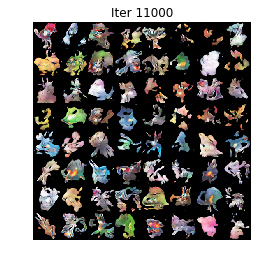

[846/1000][3/13]	Loss_D: -0.2380	Loss_G: -0.3642
[846/1000][4/13]	Loss_D: -0.2493	Loss_G: -0.3915
[846/1000][5/13]	Loss_D: -0.2539	Loss_G: -0.3694
[846/1000][6/13]	Loss_D: -0.2295	Loss_G: -0.4098
[846/1000][7/13]	Loss_D: -0.2158	Loss_G: -0.3565
[846/1000][8/13]	Loss_D: -0.2330	Loss_G: -0.4038
[846/1000][9/13]	Loss_D: -0.2291	Loss_G: -0.3621
[846/1000][10/13]	Loss_D: -0.2427	Loss_G: -0.3959
[846/1000][11/13]	Loss_D: -0.2205	Loss_G: -0.3664
[846/1000][12/13]	Loss_D: -0.2163	Loss_G: -0.4141
[847/1000][0/13]	Loss_D: -0.2304	Loss_G: -0.3609
[847/1000][1/13]	Loss_D: -0.2372	Loss_G: -0.4022
[847/1000][2/13]	Loss_D: -0.2258	Loss_G: -0.3617
[847/1000][3/13]	Loss_D: -0.2294	Loss_G: -0.3971
[847/1000][4/13]	Loss_D: -0.2469	Loss_G: -0.3667
[847/1000][5/13]	Loss_D: -0.2476	Loss_G: -0.3965
[847/1000][6/13]	Loss_D: -0.2391	Loss_G: -0.3640
[847/1000][7/13]	Loss_D: -0.2322	Loss_G: -0.4220
[847/1000][8/13]	Loss_D: -0.2014	Loss_G: -0.3579
[847/1000][9/13]	Loss_D: -0.2430	Loss_G: -0.3914
[847/1000][10/13]

[859/1000][1/13]	Loss_D: -0.2451	Loss_G: -0.3899
[859/1000][2/13]	Loss_D: -0.2489	Loss_G: -0.3634
[859/1000][3/13]	Loss_D: -0.2392	Loss_G: -0.4040
[859/1000][4/13]	Loss_D: -0.2217	Loss_G: -0.3589
[859/1000][5/13]	Loss_D: -0.2237	Loss_G: -0.4180
[859/1000][6/13]	Loss_D: -0.2123	Loss_G: -0.3617
[859/1000][7/13]	Loss_D: -0.2294	Loss_G: -0.4302
[859/1000][8/13]	Loss_D: -0.2171	Loss_G: -0.3613
[859/1000][9/13]	Loss_D: -0.2409	Loss_G: -0.3947
[859/1000][10/13]	Loss_D: -0.2426	Loss_G: -0.3629
[859/1000][11/13]	Loss_D: -0.2511	Loss_G: -0.3881
[859/1000][12/13]	Loss_D: -0.2271	Loss_G: -0.3630
[860/1000][0/13]	Loss_D: -0.2137	Loss_G: -0.4142
[860/1000][1/13]	Loss_D: -0.2164	Loss_G: -0.3611
[860/1000][2/13]	Loss_D: -0.2375	Loss_G: -0.4104
[860/1000][3/13]	Loss_D: -0.2318	Loss_G: -0.3596
[860/1000][4/13]	Loss_D: -0.2426	Loss_G: -0.4016
[860/1000][5/13]	Loss_D: -0.2439	Loss_G: -0.3616
[860/1000][6/13]	Loss_D: -0.2295	Loss_G: -0.4188
[860/1000][7/13]	Loss_D: -0.2331	Loss_G: -0.3609
[860/1000][8/13]	

[871/1000][12/13]	Loss_D: -0.2409	Loss_G: -0.3633
[872/1000][0/13]	Loss_D: -0.2458	Loss_G: -0.3933
[872/1000][1/13]	Loss_D: -0.2549	Loss_G: -0.3662
[872/1000][2/13]	Loss_D: -0.2269	Loss_G: -0.4195
[872/1000][3/13]	Loss_D: -0.2281	Loss_G: -0.3590
[872/1000][4/13]	Loss_D: -0.2299	Loss_G: -0.4305
[872/1000][5/13]	Loss_D: -0.2187	Loss_G: -0.3582
[872/1000][6/13]	Loss_D: -0.2233	Loss_G: -0.4441
[872/1000][7/13]	Loss_D: -0.2367	Loss_G: -0.3636
[872/1000][8/13]	Loss_D: -0.2285	Loss_G: -0.4111
[872/1000][9/13]	Loss_D: -0.2366	Loss_G: -0.3665
[872/1000][10/13]	Loss_D: -0.2287	Loss_G: -0.4072
[872/1000][11/13]	Loss_D: -0.2464	Loss_G: -0.3641
[872/1000][12/13]	Loss_D: -0.2473	Loss_G: -0.3940
[873/1000][0/13]	Loss_D: -0.2480	Loss_G: -0.3657
[873/1000][1/13]	Loss_D: -0.2189	Loss_G: -0.4176
[873/1000][2/13]	Loss_D: -0.2283	Loss_G: -0.3594
[873/1000][3/13]	Loss_D: -0.2275	Loss_G: -0.4147
[873/1000][4/13]	Loss_D: -0.2269	Loss_G: -0.3569
[873/1000][5/13]	Loss_D: -0.2479	Loss_G: -0.3900
[873/1000][6/13]

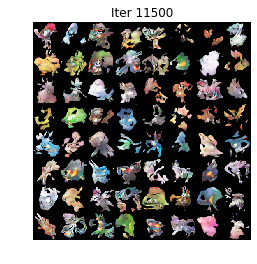

[884/1000][9/13]	Loss_D: -0.2433	Loss_G: -0.4106
[884/1000][10/13]	Loss_D: -0.2274	Loss_G: -0.3586
[884/1000][11/13]	Loss_D: -0.2252	Loss_G: -0.4193
[884/1000][12/13]	Loss_D: -0.2267	Loss_G: -0.3623
[885/1000][0/13]	Loss_D: -0.2444	Loss_G: -0.3921
[885/1000][1/13]	Loss_D: -0.2430	Loss_G: -0.3660
[885/1000][2/13]	Loss_D: -0.2365	Loss_G: -0.4088
[885/1000][3/13]	Loss_D: -0.2196	Loss_G: -0.3535
[885/1000][4/13]	Loss_D: -0.2439	Loss_G: -0.3944
[885/1000][5/13]	Loss_D: -0.2236	Loss_G: -0.3612
[885/1000][6/13]	Loss_D: -0.2302	Loss_G: -0.4089
[885/1000][7/13]	Loss_D: -0.2230	Loss_G: -0.3575
[885/1000][8/13]	Loss_D: -0.1638	Loss_G: -0.4725
[885/1000][9/13]	Loss_D: -0.2162	Loss_G: -0.3590
[885/1000][10/13]	Loss_D: -0.2492	Loss_G: -0.3795
[885/1000][11/13]	Loss_D: -0.2485	Loss_G: -0.3848
[885/1000][12/13]	Loss_D: -0.2490	Loss_G: -0.3736
[886/1000][0/13]	Loss_D: -0.2223	Loss_G: -0.4079
[886/1000][1/13]	Loss_D: -0.2308	Loss_G: -0.3578
[886/1000][2/13]	Loss_D: -0.2412	Loss_G: -0.3959
[886/1000][3/1

[897/1000][7/13]	Loss_D: -0.2301	Loss_G: -0.4092
[897/1000][8/13]	Loss_D: -0.2209	Loss_G: -0.3585
[897/1000][9/13]	Loss_D: -0.2298	Loss_G: -0.4141
[897/1000][10/13]	Loss_D: -0.2237	Loss_G: -0.3644
[897/1000][11/13]	Loss_D: -0.2253	Loss_G: -0.4086
[897/1000][12/13]	Loss_D: -0.2260	Loss_G: -0.3620
[898/1000][0/13]	Loss_D: -0.2493	Loss_G: -0.3922
[898/1000][1/13]	Loss_D: -0.2440	Loss_G: -0.3618
[898/1000][2/13]	Loss_D: -0.2435	Loss_G: -0.3955
[898/1000][3/13]	Loss_D: -0.2405	Loss_G: -0.3648
[898/1000][4/13]	Loss_D: -0.2115	Loss_G: -0.4543
[898/1000][5/13]	Loss_D: -0.1662	Loss_G: -0.3649
[898/1000][6/13]	Loss_D: -0.2244	Loss_G: -0.4015
[898/1000][7/13]	Loss_D: -0.2365	Loss_G: -0.3590
[898/1000][8/13]	Loss_D: -0.2284	Loss_G: -0.4033
[898/1000][9/13]	Loss_D: -0.2296	Loss_G: -0.3583
[898/1000][10/13]	Loss_D: -0.2281	Loss_G: -0.4117
[898/1000][11/13]	Loss_D: -0.2329	Loss_G: -0.3615
[898/1000][12/13]	Loss_D: -0.2388	Loss_G: -0.3942
[899/1000][0/13]	Loss_D: -0.2404	Loss_G: -0.3606
[899/1000][1/1

[910/1000][5/13]	Loss_D: -0.2207	Loss_G: -0.3597
[910/1000][6/13]	Loss_D: -0.2457	Loss_G: -0.4006
[910/1000][7/13]	Loss_D: -0.2115	Loss_G: -0.3601
[910/1000][8/13]	Loss_D: -0.2098	Loss_G: -0.4092
[910/1000][9/13]	Loss_D: -0.2388	Loss_G: -0.3647
[910/1000][10/13]	Loss_D: -0.2197	Loss_G: -0.4250
[910/1000][11/13]	Loss_D: -0.2316	Loss_G: -0.3601
[910/1000][12/13]	Loss_D: -0.2329	Loss_G: -0.4084
[911/1000][0/13]	Loss_D: -0.2511	Loss_G: -0.3636
[911/1000][1/13]	Loss_D: -0.2391	Loss_G: -0.3972
[911/1000][2/13]	Loss_D: -0.2356	Loss_G: -0.3600
[911/1000][3/13]	Loss_D: -0.2307	Loss_G: -0.4205
[911/1000][4/13]	Loss_D: -0.2267	Loss_G: -0.3581
[911/1000][5/13]	Loss_D: -0.2370	Loss_G: -0.4178
[911/1000][6/13]	Loss_D: -0.2278	Loss_G: -0.3628
[911/1000][7/13]	Loss_D: -0.2055	Loss_G: -0.4437
[911/1000][8/13]	Loss_D: -0.2349	Loss_G: -0.3657
[911/1000][9/13]	Loss_D: -0.2437	Loss_G: -0.4011
[911/1000][10/13]	Loss_D: -0.2383	Loss_G: -0.3612
[911/1000][11/13]	Loss_D: -0.2328	Loss_G: -0.4094
[911/1000][12/1

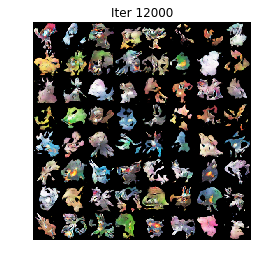

[923/1000][2/13]	Loss_D: -0.2406	Loss_G: -0.3972
[923/1000][3/13]	Loss_D: -0.2403	Loss_G: -0.3658
[923/1000][4/13]	Loss_D: -0.2349	Loss_G: -0.4064
[923/1000][5/13]	Loss_D: -0.2137	Loss_G: -0.3570
[923/1000][6/13]	Loss_D: -0.2176	Loss_G: -0.4547
[923/1000][7/13]	Loss_D: -0.2302	Loss_G: -0.3592
[923/1000][8/13]	Loss_D: -0.2341	Loss_G: -0.4011
[923/1000][9/13]	Loss_D: -0.2392	Loss_G: -0.3625
[923/1000][10/13]	Loss_D: -0.2441	Loss_G: -0.3964
[923/1000][11/13]	Loss_D: -0.2397	Loss_G: -0.3636
[923/1000][12/13]	Loss_D: -0.2269	Loss_G: -0.4114
[924/1000][0/13]	Loss_D: -0.2300	Loss_G: -0.3620
[924/1000][1/13]	Loss_D: -0.2506	Loss_G: -0.3891
[924/1000][2/13]	Loss_D: -0.2534	Loss_G: -0.3646
[924/1000][3/13]	Loss_D: -0.2355	Loss_G: -0.4045
[924/1000][4/13]	Loss_D: -0.2196	Loss_G: -0.3612
[924/1000][5/13]	Loss_D: -0.2181	Loss_G: -0.4269
[924/1000][6/13]	Loss_D: -0.2060	Loss_G: -0.3628
[924/1000][7/13]	Loss_D: -0.2409	Loss_G: -0.4031
[924/1000][8/13]	Loss_D: -0.2388	Loss_G: -0.3641
[924/1000][9/13]	

[936/1000][0/13]	Loss_D: -0.2389	Loss_G: -0.3572
[936/1000][1/13]	Loss_D: -0.2417	Loss_G: -0.3981
[936/1000][2/13]	Loss_D: -0.2454	Loss_G: -0.3649
[936/1000][3/13]	Loss_D: -0.2389	Loss_G: -0.4009
[936/1000][4/13]	Loss_D: -0.2229	Loss_G: -0.3604
[936/1000][5/13]	Loss_D: -0.2294	Loss_G: -0.4224
[936/1000][6/13]	Loss_D: -0.1983	Loss_G: -0.3560
[936/1000][7/13]	Loss_D: -0.1858	Loss_G: -0.4322
[936/1000][8/13]	Loss_D: -0.2410	Loss_G: -0.3629
[936/1000][9/13]	Loss_D: -0.2422	Loss_G: -0.3939
[936/1000][10/13]	Loss_D: -0.2507	Loss_G: -0.3659
[936/1000][11/13]	Loss_D: -0.2151	Loss_G: -0.4458
[936/1000][12/13]	Loss_D: -0.1869	Loss_G: -0.3625
[937/1000][0/13]	Loss_D: -0.2044	Loss_G: -0.4271
[937/1000][1/13]	Loss_D: -0.2265	Loss_G: -0.3660
[937/1000][2/13]	Loss_D: -0.2282	Loss_G: -0.4088
[937/1000][3/13]	Loss_D: -0.2373	Loss_G: -0.3659
[937/1000][4/13]	Loss_D: -0.2368	Loss_G: -0.4078
[937/1000][5/13]	Loss_D: -0.2492	Loss_G: -0.3635
[937/1000][6/13]	Loss_D: -0.2439	Loss_G: -0.3951
[937/1000][7/13]	

[948/1000][11/13]	Loss_D: -0.2124	Loss_G: -0.4090
[948/1000][12/13]	Loss_D: -0.2212	Loss_G: -0.3596
[949/1000][0/13]	Loss_D: -0.2517	Loss_G: -0.3942
[949/1000][1/13]	Loss_D: -0.2437	Loss_G: -0.3643
[949/1000][2/13]	Loss_D: -0.2460	Loss_G: -0.4000
[949/1000][3/13]	Loss_D: -0.2411	Loss_G: -0.3625
[949/1000][4/13]	Loss_D: -0.2329	Loss_G: -0.4067
[949/1000][5/13]	Loss_D: -0.2176	Loss_G: -0.3614
[949/1000][6/13]	Loss_D: -0.2049	Loss_G: -0.4181
[949/1000][7/13]	Loss_D: -0.2318	Loss_G: -0.3620
[949/1000][8/13]	Loss_D: -0.2290	Loss_G: -0.4197
[949/1000][9/13]	Loss_D: -0.2209	Loss_G: -0.3612
[949/1000][10/13]	Loss_D: -0.2317	Loss_G: -0.4235
[949/1000][11/13]	Loss_D: -0.2024	Loss_G: -0.3594
[949/1000][12/13]	Loss_D: -0.2278	Loss_G: -0.4038
[950/1000][0/13]	Loss_D: -0.2279	Loss_G: -0.3613
[950/1000][1/13]	Loss_D: -0.2490	Loss_G: -0.3924
[950/1000][2/13]	Loss_D: -0.2566	Loss_G: -0.3776
[950/1000][3/13]	Loss_D: -0.2525	Loss_G: -0.3881
[950/1000][4/13]	Loss_D: -0.2420	Loss_G: -0.3610
[950/1000][5/13

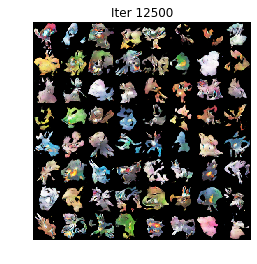

[961/1000][8/13]	Loss_D: -0.2443	Loss_G: -0.3636
[961/1000][9/13]	Loss_D: -0.2128	Loss_G: -0.4282
[961/1000][10/13]	Loss_D: -0.2293	Loss_G: -0.3667
[961/1000][11/13]	Loss_D: -0.2125	Loss_G: -0.4097
[961/1000][12/13]	Loss_D: -0.2185	Loss_G: -0.3575
[962/1000][0/13]	Loss_D: -0.2458	Loss_G: -0.3920
[962/1000][1/13]	Loss_D: -0.2554	Loss_G: -0.3696
[962/1000][2/13]	Loss_D: -0.2403	Loss_G: -0.4021
[962/1000][3/13]	Loss_D: -0.2307	Loss_G: -0.3635
[962/1000][4/13]	Loss_D: -0.2296	Loss_G: -0.4189
[962/1000][5/13]	Loss_D: -0.2245	Loss_G: -0.3582
[962/1000][6/13]	Loss_D: -0.2318	Loss_G: -0.4138
[962/1000][7/13]	Loss_D: -0.2327	Loss_G: -0.3629
[962/1000][8/13]	Loss_D: -0.1995	Loss_G: -0.4515
[962/1000][9/13]	Loss_D: -0.1950	Loss_G: -0.3597
[962/1000][10/13]	Loss_D: -0.2403	Loss_G: -0.4100
[962/1000][11/13]	Loss_D: -0.2292	Loss_G: -0.3602
[962/1000][12/13]	Loss_D: -0.2368	Loss_G: -0.3987
[963/1000][0/13]	Loss_D: -0.2448	Loss_G: -0.3638
[963/1000][1/13]	Loss_D: -0.2392	Loss_G: -0.4089
[963/1000][2/1

[974/1000][6/13]	Loss_D: -0.2433	Loss_G: -0.3914
[974/1000][7/13]	Loss_D: -0.2358	Loss_G: -0.3618
[974/1000][8/13]	Loss_D: -0.2285	Loss_G: -0.4147
[974/1000][9/13]	Loss_D: -0.2287	Loss_G: -0.3636
[974/1000][10/13]	Loss_D: -0.2273	Loss_G: -0.4061
[974/1000][11/13]	Loss_D: -0.2409	Loss_G: -0.3605
[974/1000][12/13]	Loss_D: -0.2306	Loss_G: -0.4071
[975/1000][0/13]	Loss_D: -0.2314	Loss_G: -0.3599
[975/1000][1/13]	Loss_D: -0.2339	Loss_G: -0.4147
[975/1000][2/13]	Loss_D: -0.2176	Loss_G: -0.3629
[975/1000][3/13]	Loss_D: -0.2328	Loss_G: -0.4074
[975/1000][4/13]	Loss_D: -0.2151	Loss_G: -0.3679
[975/1000][5/13]	Loss_D: -0.2316	Loss_G: -0.4137
[975/1000][6/13]	Loss_D: -0.2332	Loss_G: -0.3653
[975/1000][7/13]	Loss_D: -0.2299	Loss_G: -0.4199
[975/1000][8/13]	Loss_D: -0.2196	Loss_G: -0.3578
[975/1000][9/13]	Loss_D: -0.2460	Loss_G: -0.3940
[975/1000][10/13]	Loss_D: -0.2396	Loss_G: -0.3618
[975/1000][11/13]	Loss_D: -0.2306	Loss_G: -0.4296
[975/1000][12/13]	Loss_D: -0.2074	Loss_G: -0.3625
[976/1000][0/1

[987/1000][4/13]	Loss_D: -0.2519	Loss_G: -0.3630
[987/1000][5/13]	Loss_D: -0.2344	Loss_G: -0.4050
[987/1000][6/13]	Loss_D: -0.2316	Loss_G: -0.3602
[987/1000][7/13]	Loss_D: -0.2372	Loss_G: -0.4176
[987/1000][8/13]	Loss_D: -0.1961	Loss_G: -0.3564
[987/1000][9/13]	Loss_D: -0.2087	Loss_G: -0.4175
[987/1000][10/13]	Loss_D: -0.2473	Loss_G: -0.3630
[987/1000][11/13]	Loss_D: -0.2270	Loss_G: -0.4115
[987/1000][12/13]	Loss_D: -0.2387	Loss_G: -0.3650
[988/1000][0/13]	Loss_D: -0.2385	Loss_G: -0.4063
[988/1000][1/13]	Loss_D: -0.2358	Loss_G: -0.3636
[988/1000][2/13]	Loss_D: -0.2409	Loss_G: -0.3963
[988/1000][3/13]	Loss_D: -0.2417	Loss_G: -0.3646
[988/1000][4/13]	Loss_D: -0.2468	Loss_G: -0.3942
[988/1000][5/13]	Loss_D: -0.2377	Loss_G: -0.3584
[988/1000][6/13]	Loss_D: -0.2272	Loss_G: -0.4354
[988/1000][7/13]	Loss_D: -0.2320	Loss_G: -0.3579
[988/1000][8/13]	Loss_D: -0.2209	Loss_G: -0.4319
[988/1000][9/13]	Loss_D: -0.1846	Loss_G: -0.3668
[988/1000][10/13]	Loss_D: -0.2187	Loss_G: -0.4042
[988/1000][11/13

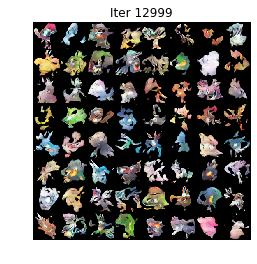

In [54]:
# Создали генератор
netG = Generator().to(device)

# Инициализировали его
netG.apply(weights_init)

# Вывели модель для отладки
print(netG)

# Создали дискриминатор
netD = Discriminator().to(device)

# Ининциализировали весе
netD.apply(weights_init)

# Вывели модель для отладки
print(netD)

# Фиксированный шум для мониторинга качества генерации
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Коэффициент обучения
lr = 0.00005

# Оптимизаторы для сеток
optimizerD = optim.RMSprop(netD.parameters(), lr=lr)
optimizerG = optim.RMSprop(netG.parameters(), lr=lr)

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, (data,_) in enumerate(dataloader, 0):
    
        for _ in range(5):
            # обучаем дискриминатор
            # d_loss = wasserstein loss дискриминатора
            # real_score - оценки дискриминатора для настоящих картинок
            # fake_score - оценки дискриминатора для фейковых картинок
            # помните, что на одну итерацию обучения генератора
            # должно приходиться несколько итераций обучения дискриминатора!
            
            netD.zero_grad()
            # Format batch
            real_cpu = data.to(device)
            b_size = real_cpu.size(0)
            # Forward pass real batch through D
            real_score = netD(real_cpu).view(-1)
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            # Classify all fake batch with D
            fake_score = netD(fake.detach()).view(-1)

            d_loss = -(torch.mean(real_score) - torch.mean(fake_score))
            d_loss.backward()
            optimizerD.step()
            
            for p in netD.parameters():
                p.data.clamp_(-0.01, 0.01)
            
            netD.zero_grad()
            

        netG.zero_grad()
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        output = netD(fake).view(-1)
        g_loss = -torch.mean(output)
        
        g_loss.backward()
        optimizerG.step()

        # Output training stats
        if i % 1 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                  % (epoch, num_epochs, i, len(dataloader), d_loss, g_loss))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

#         # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

            plt.axis("off")
            plt.title("Iter {}".format(iters))
            plt.imshow(np.transpose(img_list[-1],(1,2,0)))
            plt.show()
            plt.close()

        iters += 1
    if epoch % 25 == 0:
        torch.save(netG, "models/netG_{}.pt".format(epoch))
        torch.save(netD, "models/netD_{}.pt".format(epoch))

In [ ]:
netG = torch.load("models/netG_100.pt")
netD = torch.load("models/netD_100.pt")

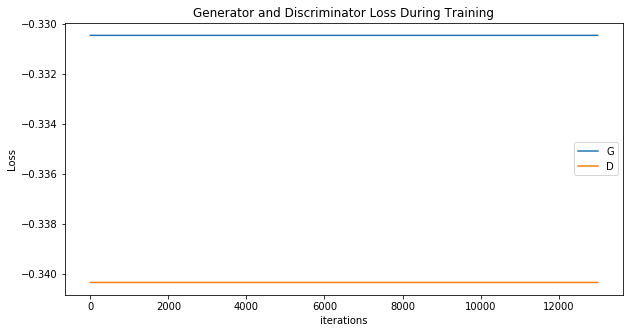

In [58]:
# Выводим на печать всяческие loss'ы
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

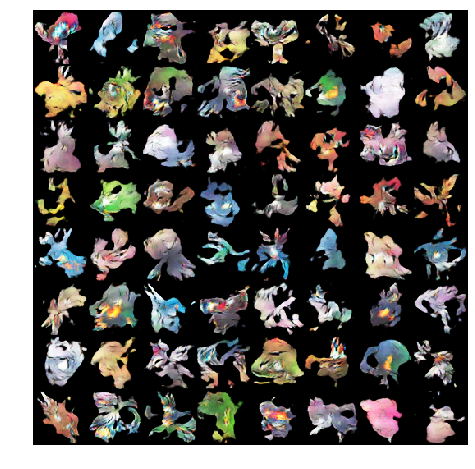

In [59]:
# Проигрываем результаты генерации для фиксированного шума
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

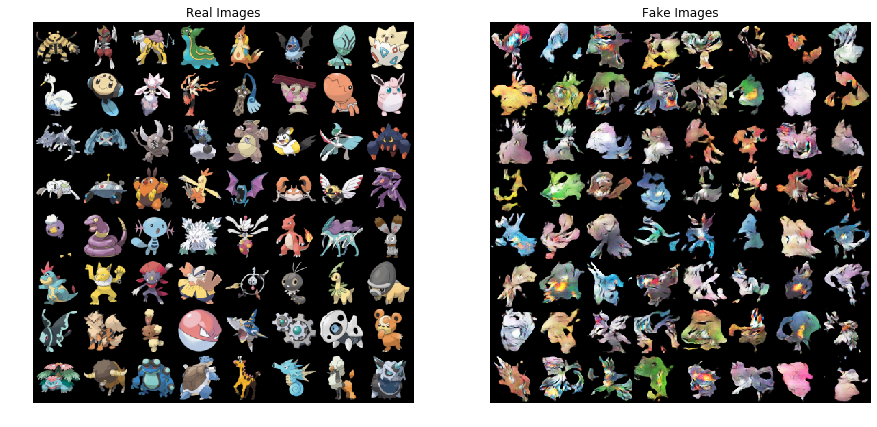

In [57]:
# Сравниваем настоящие данные и генерацию
real_batch = next(iter(dataloader))

# Рисуем трейнсет
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Рисуем фейки
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()